# Plot utilities

In [64]:
import os
import pyam
import warnings
import geopandas
import geodatasets
import ast
import string

import pandas as pd
import seaborn as sns
import numpy as np
import scipy.stats as stats

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

warnings.simplefilter(action='ignore', category=FutureWarning)
from IPython.display import display, HTML
from textwrap import wrap

In [65]:
sns.set_style("whitegrid")
sns.set_context("notebook")
plt.rc("axes.spines", top=False, right=False, left=False, bottom=False)

## Globals

In [66]:
map_3035 = geopandas.read_file('data/maps/CNTR_RG_20M_2024_3035.gpkg')
map_3035 = map_3035.rename({'NAME_ENGL':'region'},axis=1)

In [67]:
map_r10 = geopandas.read_file('data/maps/r10_regions.geojson')
map_r10 = map_r10.rename({'I_REGION':'region'},axis=1)

In [68]:
map_4326 = geopandas.read_file('data/maps/CNTR_RG_20M_2024_4326.gpkg')
map_4326 = map_4326.rename({'NAME_ENGL':'region'},axis=1)

In [69]:
EU27 = ['Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland',
        'France','Germany','Greece','Hungary','Ireland','Italy','Latvia','Lithuania','Luxembourg',
        'Malta','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia','Spain','Sweden']

In [70]:
Europe = EU27 + ['Albania','United Kingdom','Armenia','Belarus','Bosnia and Herzegovina',
                  'Iceland','Moldova','Montenegro','North Macedonia','Russian Federation','Norway','Serbia','Switzerland',
                  'Turkey','Ukraine']

In [71]:
R10 = map_r10.region.tolist()

In [72]:
convert_names = {'region': {'Turkey': 'Türkiye'}}

In [73]:
common_defs = pd.read_excel('data/common-definitions-template.xlsx',sheet_name='region')

In [74]:
common_defs_r10 = common_defs[common_defs.hierarchy == 'R10']

In [75]:
r10_regions = common_defs_r10.region.to_list()

In [76]:
convert_r10 = common_defs_r10.set_index('ar6')['region'].to_dict()

In [77]:
ssp_order = ['SSP1','SSP2','SSP3','SSP4','SSP5']

In [78]:
impacts_assessed = [
    'Emissions|CO2',
    'RES share',
    'Energy intensity',
    'Carbon intensity'
]

In [79]:
impacts_assessed_change = [
    'Emissions|CO2 - % change between 2020 and 2050',
    'RES share',
    'Energy intensity',
    'Carbon intensity'
]

In [80]:
impacts_assessed_titles = [
    'CO2 emissions change between 2020 and 2050 [%]',
    'RES share in 2050 [0-1]',
    'Energy intensity of GDP in 2050 [GJ/US$2010]',
    'Carbon intensity of energy in 2050 [kgCO2/GJ]'
]

In [81]:
assumptions_assessed = [
    'Human Development Index [unweighted mean]',
    'Gender Inequality Index',
    'Rule-of-Law Index [unweighted mean]',
    'Governance Index|Government Effectiveness [unweighted mean]',
    'Governance Index|Control of Corruption [unweighted mean]',
    'Gini Income Inequality Coefficient [unweighted mean]',
    'Population|Extreme Poverty [Share]'
]

In [189]:
main_assumptions_assessed = [
    'Human Development Index',
    'Gender Inequality Index',
    'Rule-of-Law Index',
    'Governance Index|Government Effectiveness',
    'Gini Income Inequality Coefficient',
]

In [174]:
countries_plotted = ['Libya', 'Nigeria', 'Somalia', 'South Africa', 'Sudan', 'Iran', 'Saudi Arabia', 
                     'Bangladesh', 'China', 'Fiji', 'India', 'Indonesia', 'South Korea', 'Viet Nam', 
                     'Germany', 'Greece', 'Poland', 'Russian Federation', 'Sweden', 'Ukraine', 'Canada', 
                     'United States', 'Barbados', 'Bolivia', 'Brazil', 'Colombia', 'Mexico', 'Venezuela', 
                     'Australia', 'Japan', 'New Zealand']

## Plotting utils

In [82]:
def plot_map(df_plot, map=map_3035):
    merged_map = pd.merge(map,df_plot,how='left',left_on='region',right_on='region')

    ax = merged_map.plot(figsize=(8, 8),
                         column='value',
                         legend=True,
                         legend_kwds={
                             "label": "% change between 2020 and 2050", 
                         },
                         missing_kwds={
                            "color": "lightgrey",
                            "label": "Missing values",
                        },)
    ax.set_axis_off();
    ax.set_ylim([1000000, 6000000])
    ax.set_xlim([2000000, 7000000])

    return ax

In [83]:
def plot_map_changes(df, variable, region=None, start=2020, end=2050, map=map_3035):

    df_plot.scenarios 
    
    df_change = ((df_plot.filter(year=end).timeseries()[end]/df_plot.filter(year=start).timeseries()[start])-1)*100
    var_name = f'% change between {start} and {end}'
    df_change.name = var_name
        
    merged_map = pd.merge(map,df_change,how='left',left_on='region',right_on='region')

    max_range = max(abs(merged_map[var_name].max()),abs(merged_map[var_name].min()))

    ax = merged_map.plot(figsize=(8, 8),
                         column=var_name,
                         legend=True,
                         cmap='RdYlGn',
                         legend_kwds={
                             "label": var_name, 
                         },
                         vmax=max_range,
                         vmin=-max_range,
                         missing_kwds={
                            "color": "lightgrey",
                            "label": "Missing values",
                        },)
    ax.set_axis_off();
    ax.set_ylim([1000000, 6000000])
    ax.set_xlim([2000000, 7000000])

    return ax

In [84]:
def plot_map_by_scenario(df, variable, region=None, start = 2020, end = 2050, scenario_col = 'scenario',
                         size = 3.5, fig_cols=2, fig_rows=3, map = map_4326, eu_focus=False, 
                         file_name='',cmap_change='RdYlGn',cmap_start = 'Blues'):
    
    
    df_plot = df.filter(region=region,variable=variable,year=[start,end])
    scenarios = df_plot[scenario_col].dropna().unique()
    scenarios = np.insert(scenarios,0,start)
    
    if eu_focus:
        fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*size*1.4, fig_rows*size))
        map = map_3035
        legend_shrink, legend_pad, legend_aspect = 0.6, 0.1, 30
        title_fontsize=11
    else:
        fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*size*2, fig_rows*size))
        legend_shrink, legend_pad, legend_aspect = 0.7, 0, 40
        title_fontsize=12

    axs = axs.flatten()
    
    end_data = df_plot.filter(year=end).timeseries()[end] 
    start_data = df_plot.filter(year=start).timeseries()[start]
    
    df_change = (((end_data/start_data)-1)*100)
    var_name = 'value'#f'% change between {start} and {end}'
    df_change.name = var_name
    
    max_range = max(abs(df_change.max()),abs(df_change.min()))
    
    df_change = df_change.reset_index()
    
    for i, scenario in enumerate(scenarios):
        if scenario == start:
            df_plot_pd = df_plot.as_pandas()
            df_scenario = df_plot_pd[(df_plot_pd.scenario=='SSP2')&(df_plot_pd.year==start)]
            axs[i].set_title(f'(a) {variable} in {start}',
                            fontsize=title_fontsize)
            cmap = cmap_start
            vmax = None
            vmin = None
            format_cbar_nums = None
        else:
            df_scenario = df_change[df_change.scenario==scenario]
            axs[i].set_title(f'({string.ascii_lowercase[i]}) % change between {start} and {end} [{scenario}]',
                            fontsize=title_fontsize)
            cmap = cmap_change
            vmax = max_range
            vmin = -max_range
            format_cbar_nums = '%.0f%%'

        df_scenario = df_scenario.replace(convert_names)
    
        merged_map = pd.merge(map,df_scenario,how='left',left_on='region',right_on='region')
         
        merged_map.plot(
            ax=axs[i],
            column=var_name,
            legend=True,
            cmap=cmap,
            vmax=vmax,
            vmin=vmin,
            edgecolor='Black',
            linewidth=0.1,
            missing_kwds={"color": "lightgrey","label": "Missing values"},
            legend_kwds={"orientation": "horizontal","shrink":legend_shrink,
                         "pad":legend_pad,"aspect":legend_aspect,"format":format_cbar_nums}
        )
        axs[i].set_axis_off();
        
        if eu_focus:
            axs[i].set_ylim([1300000, 5400000])
            axs[i].set_xlim([2300000, 6600000])
            plt.subplots_adjust(wspace=0, hspace=0.15)
        else:
            axs[i].set_ylim([-60, 90])
            plt.subplots_adjust(wspace=-0.10, hspace=0.15)
    
    # axs[-1].set_axis_off();
    # fig.suptitle(f"{variable} - {var_name}", fontsize='medium')

    if file_name:
        plt.savefig(f'figures/{file_name}', bbox_inches='tight')

In [85]:
def plot_year_comparison(df, variable, region=None, scenario_col = 'scenario',start=2020, end=2050, 
                         fig_cols=2, fig_rows=3, size = 3.5, cmap = 'viridis', eu_focus=False, 
                         unit = '', map = map_4326, file_name='', y_range=[]):
    
    df_plot = df.filter(region=region,variable=variable,year=[start,end]).as_pandas()
    scenarios = df_plot[scenario_col].dropna().unique()
    scenarios = np.insert(scenarios,0,start)
    
    if eu_focus:
        fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*size, fig_rows*size))
        map = map_3035
        y_cbar = size/40
    else:
        fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(fig_cols*size*2, fig_rows*size))
        y_cbar = size/27
    
    axs = axs.flatten()

    if y_range:
        min = y_range[0]
        max = y_range[1]
    else: 
        min = df_plot.value.min()
        max = df_plot.value.max()

    mappable = cm.ScalarMappable(
        norm=mcolors.Normalize(min, max),
        cmap=cmap
    )
    cb_ax = fig.add_axes([size/10, y_cbar, size/10, size/300])
    cbar = fig.colorbar(mappable, cax=cb_ax, orientation='horizontal', label=f'{variable} {unit}')
    
    for i, scenario in enumerate(scenarios):
        if scenario == start:
            df_scenario = df_plot[(df_plot.scenario=='SSP2')&(df_plot.year==start)]
            axs[i].set_title(f'{start}')
        else:
            df_scenario = df_plot[(df_plot.scenario==scenario)&(df_plot.year==end)]
            axs[i].set_title(f'{end} [{scenario}]')
    
        df_scenario = df_scenario.replace(convert_names)
    
        merged_map = pd.merge(map,df_scenario,how='left',left_on='region',right_on='region')
         
        merged_map.plot(
            ax=axs[i],
            column='value',
            cmap=cmap,
            vmax=max,
            vmin=min,
            edgecolor='Black',
            linewidth=0.1,
            missing_kwds={
                "color": "lightgrey",
                "label": "Missing values",
            },)
    
        axs[i].set_axis_off();
    
        if eu_focus:
            axs[i].set_ylim([1300000, 5400000])
            axs[i].set_xlim([2300000, 6600000])
        else:
            axs[i].set_ylim([-60, 90])
            plt.subplots_adjust(wspace=0, hspace=-0.25)

    if file_name:
        plt.savefig(f'figures/{file_name}', bbox_inches='tight')

In [86]:
def percentage_change(df,start=2020,end=2050,variable='value'):
    df_start = df[df.year==start][variable]
    df_end = df[df.year==end][variable]

    if len(df_end.index) < len(df_start.index):
        df_start = df_start[df_end.index]
    else:
        df_end = df_end[df_start.index]
    
    return ((df_end/df_start)-1)*100

In [87]:
def value_change(df,start=2020,end=2050,variable='value'):
    df_start = df[df.year==start][variable]
    df_end = df[df.year==end][variable]

    if len(df_end.index) < len(df_start.index):
        df_start = df_start[df_end.index]
    else:
        df_end = df_end[df_start.index]
    
    return df_end-df_start

In [88]:
def calculate_col_change(df, variable=['Emissions|CO2'], start=2020, end=2050, percentage_change=False):
    
    df_indexed = df.set_index(['model','scenario','region'])
    
    df_start = df_indexed[df_indexed['year']==start]
    df_end = df_indexed[df_indexed['year']==end]

    if percentage_change:
        df_diff = ((df_end[variable]/df_start[variable])-1)*100
        df_diff.name = f'{df_diff.name} - % change between {start} and {end}'
    else:
        df_diff = df_end[variable]-df_start[variable]
        df_diff.name = f'{df_diff.name} - change between {start} and {end}'
    
    df_end_diff = pd.merge(df_end,df_diff,on=['model','scenario','region'])

    df_with_diff = pd.concat([
        df_indexed[~(df_indexed['year']==end)],
        df_end_diff,
    ]).reset_index()
    
    return df_with_diff

In [89]:
def merge_assumptions_vs_impact(df_assumption, df_impact, var_assumption, var_impact):

    joined_cols = ['region','year','SSP']
    
    df_assumption = df_assumption.as_pandas()[['region','year','scenario','value']].rename(
        {'value':var_assumption,'scenario':'SSP'},axis=1)

    df_impact = df_impact.as_pandas().rename(
        {'value':var_impact},axis=1)
    df_impact['SSP'] = df_impact.Ssp_family.map(lambda x: x if np.isnan(x) else f'SSP{int(x)}')

    df_merged = pd.merge(df_impact, df_assumption, how='inner', on=joined_cols)
    df_merged = df_merged.set_index(['model','scenario','region','SSP']) 
    
    return df_merged

In [90]:
def plot_assumption_vs_impacts(df, var_assumption, label_assumption=None, year_assumption = 2020, year_impact = 2050, 
                                impacts=impacts_assessed_change, impacts_titles=impacts_assessed_titles, ssp_order=ssp_order,
                                ylim=[0.3,1],file_name='',title_width=27):
    if not label_assumption:
        label_assumption = var_assumption
        
    df_assumption = df[df.year==year_assumption].set_index(['model','scenario','region'])
    df_impact = df[df.year==year_impact].set_index(['model','scenario','region'])
    
    df_updated = pd.concat([
        df_impact.drop(var_assumption,axis=1),
        df_assumption[var_assumption]
    ],axis=1).reset_index()
    
    df_melted = df_updated.melt(id_vars=['SSP','region',var_assumption],value_vars=impacts)
    
    g = sns.lmplot(df_melted,y=var_assumption,x='value',hue='SSP',hue_order=ssp_order,robust=False,aspect=0.5,
                   col='variable',col_wrap=4,facet_kws={'sharex':False,'ylim':ylim},
                   scatter_kws={'alpha':1,'sizes':(5, 5),'edgecolors':'none'})

    for handle in g._legend.legend_handles:
        handle.set_sizes([20])
    
    g.despine(top=False, right=False, left=False, bottom=False)
    for i, ax in enumerate(g.axes):
        ax.set_title('\n'.join(wrap(impacts_titles[i], title_width)))
        ax.set_ylabel(f'{label_assumption} in {year_assumption}')
        ax.set_xlabel('')

    if file_name:
        plt.savefig(f'figures/{file_name}', bbox_inches='tight')
    
    return g

In [91]:
def plot_assumptions_vs_impacts(df, list_assumptions, label_assumptions=[], ylims=[], year_assumption=2020,
                                year_impact=2050, impacts=impacts_assessed_change, impacts_titles=impacts_assessed_titles,
                                ssp_order=ssp_order,fig_aspect=0.8,fig_height = 3,title_width=27,font_size = 11,
                                file_name=''):

    if not label_assumptions:
        label_assumptions = list_assumptions
        
    df_assumption = df[df.year==year_assumption].set_index(['model','scenario','region'])
    df_impact = df[df.year==year_impact].set_index(['model','scenario','region'])
    
    df_updated = pd.concat([
        df_impact.drop(list_assumptions,axis=1),
        df_assumption[list_assumptions]
    ],axis=1).reset_index()
    
    df_melted_impacts = df_updated.melt(id_vars=['SSP','region']+list_assumptions,value_vars=impacts,
                                            var_name='var_impact',value_name='value_impact')
    df_melted_assumptions = df_melted_impacts.melt(id_vars=['SSP','region','var_impact','value_impact'],value_vars=list_assumptions,
                                            var_name='var_assumption',value_name='value_assumption')
    
    g = sns.lmplot(df_melted_assumptions,y='value_assumption',x='value_impact',hue='SSP',hue_order=ssp_order,robust=False,height=fig_height,
                   aspect=fig_aspect, col='var_impact',row='var_assumption',facet_kws={'sharex':False,'sharey':False},
                   scatter_kws={'alpha':1,'sizes':(5, 5),'edgecolors':'none'})
    
    for handle in g._legend.legend_handles:
        handle.set_sizes([20])
    
    g.despine(top=False, right=False, left=False, bottom=False)
    
    for i in range(len(list_assumptions)):
        for j, ax in enumerate(g.axes[i]):
            ax.set_xlabel('')
            if ylims:
                ax.set_ylim(ylims[i])

            if j == 0:
                ax.set_ylabel(f'{label_assumptions[i]} in {year_assumption}', fontsize=font_size)
            else:
                ax.set_ylabel('')
                ax.set_yticklabels([])
 
            if i == 0:
                ax.set_title('\n'.join(wrap(impacts_titles[j], title_width)), fontsize=font_size)
            else:
                ax.set_title('')

    plt.subplots_adjust(wspace = 0.2,hspace=0.25)
    
    if file_name:
        plt.savefig(f'figures/{file_name}', bbox_inches='tight')
    
    return g

## Import data

### Import SSPs

In [92]:
df_ssp = pyam.read_iiasa("ssp", variable="Mean Years of Education|Female|Age 25-29")

httpx - INFO: HTTP Request: GET https://api.manager.ece.iiasa.ac.at/legacy/anonym/ "HTTP/2 200 OK"
httpx - INFO: HTTP Request: GET https://api.manager.ece.iiasa.ac.at/legacy/applications "HTTP/2 200 OK"
httpx - INFO: HTTP Request: GET https://api.manager.ece.iiasa.ac.at/legacy/applications/IXSE_SSP/config "HTTP/2 200 OK"
pyam.iiasa - INFO: You are connected to the IXSE_SSP scenario explorer hosted by IIASA. If you use this data in any published format, please cite the data as provided in the explorer guidelines: https://data.ece.iiasa.ac.at/ssp/#/about
pyam.iiasa - INFO: You are connected as an anonymous user


In [93]:
df_ssp_gdp = pyam.IamDataFrame(data='data/SSPs/ssp_GDP.xlsx')

pyam.core - INFO: Reading file data/SSPs/ssp_GDP.xlsx


### Import SSP extensions

In [94]:
folder = 'data/SSP-Extensions'

In [95]:
ssp_ext_data = []
for file in os.listdir(folder):
    if file.endswith('.xlsx'):
        ssp_ext_data.append(pyam.IamDataFrame(f'{folder}/{file}'))
df_ssp_ext = pyam.concat(ssp_ext_data)

pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Structural_Change_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Poverty_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Risk_of_Hunger_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Gender_Inequality_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Governance_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Urbanization_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Conflict_Trap_v1.0.xlsx
pyam.core - INFO: Reading meta indicators
pyam.core - INFO: Reading file data/SSP-Extensions/SSP-Extensions_Human_Devel

### Import AR6

In [96]:
df_ar6_meta_vet = pd.read_excel('data/AR6/AR6_Scenarios_Database_metadata_indicators_v1.1.xlsx',sheet_name='meta_Ch3vetted_withclimate')

In [97]:
df_ar6_meta_vet['SSP'] = df_ar6_meta_vet.Ssp_family.map(lambda x: x if np.isnan(x) else f'SSP{int(x)}')

In [98]:
df_ar6_meta = pd.read_excel('data/AR6/AR6_Scenarios_Database_metadata_indicators_v1.1.xlsx',sheet_name='meta')

In [99]:
sub_df_new = pd.read_excel('data/AR6/R10_sub.xlsx')

In [100]:
df_ar6_r10 = pyam.IamDataFrame(
    data=sub_df_new,
    meta=df_ar6_meta_vet.rename(
        {'Model':'model','Scenario':'scenario'},axis=1
    ).set_index(['model','scenario']))

### Merge data for assumptions & impacts analysis

In [101]:
joined_cols = ['region','year','SSP']

In [102]:
df_assumptions = df_ssp_ext.filter(variable=assumptions_assessed, region=r10_regions)
df_impacts = df_ar6_r10.filter(variable=impacts_assessed)

In [103]:
df_assumptions_formatted = df_assumptions.as_pandas().pivot(
    index=['scenario','region','year'], columns='variable', values='value'
).reset_index().rename({'scenario':'SSP'},axis=1)

In [104]:
df_impacts_formatted = df_impacts.as_pandas().pivot(
    index=['model','scenario','region','year','SSP'], columns='variable', values='value'
).reset_index()

In [105]:
df_merged = pd.merge(df_assumptions_formatted, df_impacts_formatted, how='inner', on=joined_cols)

In [106]:
new_cols = []
first = True
for var in impacts_assessed:
    for set_percentage in [True,False]:
        for end_year in [2030,2050]:
            col_change = calculate_col_change(df_merged,variable=var,end=end_year,percentage_change=set_percentage)
            col_change = col_change.sort_values(['model','scenario','region','year']).reset_index(drop=True)
            if first:
                new_cols.append(col_change)
                first = False
            else:
                new_cols.append(col_change.iloc[:,-1])

In [107]:
df_merged = pd.concat(new_cols,axis=1)

In [108]:
gini_var = 'Gini Income Inequality Coefficient [unweighted mean]'
gini_var_new = 'Gini Income Inequality Coefficient [unweighted mean|share]'

In [109]:
df_merged[gini_var_new] = df_merged[gini_var]/100

## Plots for paper

### Figure 1: Assumptions vs impacts

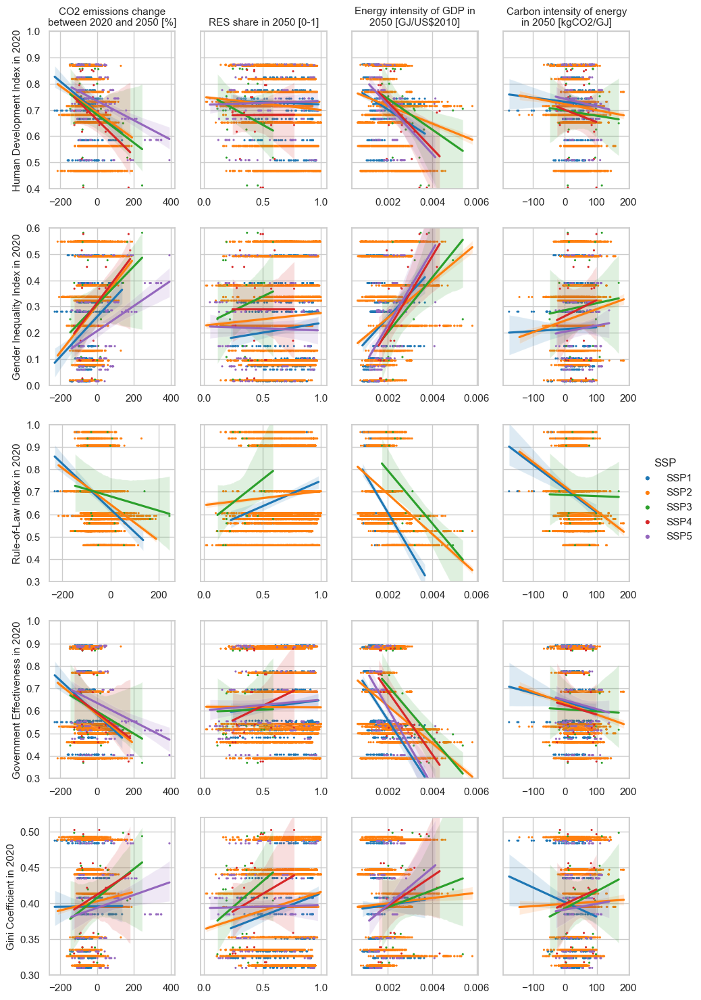

In [166]:
plot_assumptions_vs_impacts(
    df_merged,
    list_assumptions=[
        'Human Development Index [unweighted mean]',
        'Gender Inequality Index',
        'Rule-of-Law Index [unweighted mean]',
        'Governance Index|Government Effectiveness [unweighted mean]',
        'Gini Income Inequality Coefficient [unweighted mean|share]',
    ], 
    label_assumptions=[
        'Human Development Index',
        'Gender Inequality Index',
        'Rule-of-Law Index',
        'Government Effectiveness',
        'Gini Coefficient',
    ],
    ylims=[
        [0.4,1],
        [0,0.6],
        [0.3,1],
        [0.3,1],
        [0.3,0.52],
    ],
    file_name='figure1_democracy_vs_mitigation.png'
)

### Table 2: Plot quantitative indicators for countries 

In [368]:
for c in countries_plotted:
    if c not in df_ssp_ext.region:
        print(c)

In [369]:
df_plot_countries = df_ssp_ext.filter(region=countries_plotted, variable=main_assumptions_assessed, year=range(2020,2051)).timeseries()\
    .reset_index().drop(columns=['model','unit'])

In [370]:
df_table2_melt = df_plot_countries.melt(id_vars=['scenario','region','variable'],var_name='year')

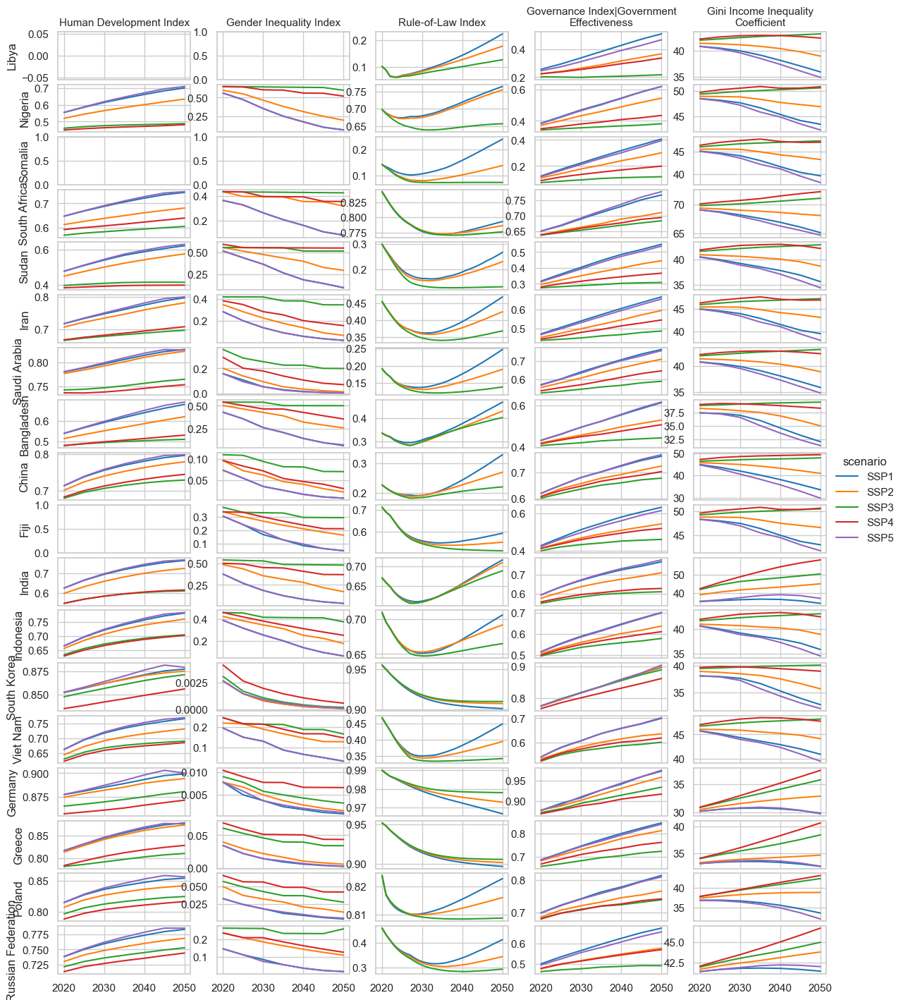

In [414]:
g = sns.relplot(df_table2_melt, kind='line', x='year', y='value', col='variable', row='region', hue='scenario', col_order=main_assumptions_assessed,
                row_order=countries_plotted[:18],facet_kws={'sharey':False},height=0.8,aspect=3)

g.despine(top=False, right=False, left=False, bottom=False)

for i in range(len(countries_plotted[:18])):
    for j, ax in enumerate(g.axes[i]):
        ax.set_xlabel('')
        
        if j == 0:
            ax.set_ylabel(countries_plotted[i])
        
        if i == 0:
            ax.set_title('\n'.join(wrap(main_assumptions_assessed[j], 27)), fontsize=11)
        else:
            ax.set_title('')

plt.subplots_adjust(hspace=0.1, wspace=0.2)

In [373]:
df_table2 = df_plot_countries.pivot(index='region',columns=['variable','scenario'],values=[2020,2050])

In [384]:
def selected_cols(year=2020): 
    return [
    	(year, 'Human Development Index', 'SSP1'),
    	(year, 'Human Development Index', 'SSP2'),
    	(year, 'Human Development Index', 'SSP3'),
    	(year, 'Human Development Index', 'SSP4'),
    	(year, 'Human Development Index', 'SSP5'),
    	(year, 'Gender Inequality Index', 'SSP1'),
    	(year, 'Gender Inequality Index', 'SSP2'),
    	(year, 'Gender Inequality Index', 'SSP3'),
    	(year, 'Gender Inequality Index', 'SSP4'),
    	(year, 'Gender Inequality Index', 'SSP5'),
    	(year, 'Rule-of-Law Index', 'SSP1'),
    	(year, 'Rule-of-Law Index', 'SSP2'),
    	(year, 'Rule-of-Law Index', 'SSP3'),
    	(year, 'Governance Index|Government Effectiveness', 'SSP1'),
    	(year, 'Governance Index|Government Effectiveness', 'SSP2'),
    	(year, 'Governance Index|Government Effectiveness', 'SSP3'),
    	(year, 'Governance Index|Government Effectiveness', 'SSP4'),
    	(year, 'Governance Index|Government Effectiveness', 'SSP5'),
    	(year, 'Gini Income Inequality Coefficient', 'SSP1'),
    	(year, 'Gini Income Inequality Coefficient', 'SSP2'),
    	(year, 'Gini Income Inequality Coefficient', 'SSP3'),
    	(year, 'Gini Income Inequality Coefficient', 'SSP4'),
    	(year, 'Gini Income Inequality Coefficient', 'SSP5'),
     ]

In [423]:
df_table2_2050 = df_table2[selected_cols(2050)]

In [424]:
df_table2_2020 = df_table2[selected_cols(2020)]

In [425]:
df_table2_2020 = df_table2_2020.groupby('variable',axis=1).min()[main_assumptions_assessed]

In [427]:
df_table2_2020.round(2).to_excel('figures/Table2_2020.xlsx')

In [411]:
df_table2_2050.round(2).to_excel('figures/Table2_2050.xlsx')

## Assumption narratives vs quantification

General remarks
- Data does not follow the narratives
- Most indicators are rather optimistic. Even in a scenario with nationalism and potentially conflicts, we don't have deterioriation of extreme poverty, government efficiency, rule of law etc.

### Participation

Assuming that a driver enabling participation is education, it seems that this indicator follows well the narratives.
- Globally, there are setbacks on education in SSP3 and SSP4 as expected.
- African countries are the ones the benefit more from improvements here.
- Europe follows the same patterns, with improvements in education in SSP1, SSP5, and to a lesser extennt to SSP2 and stagnation or even deterioration in SSP3 and SSP4.

Similar patterns are shown for HDI but to a lesser extent.

In [110]:
participation_vars = [
    'Mean Years of Education|Female|Age 25-29',
    'Human Development Index'
]

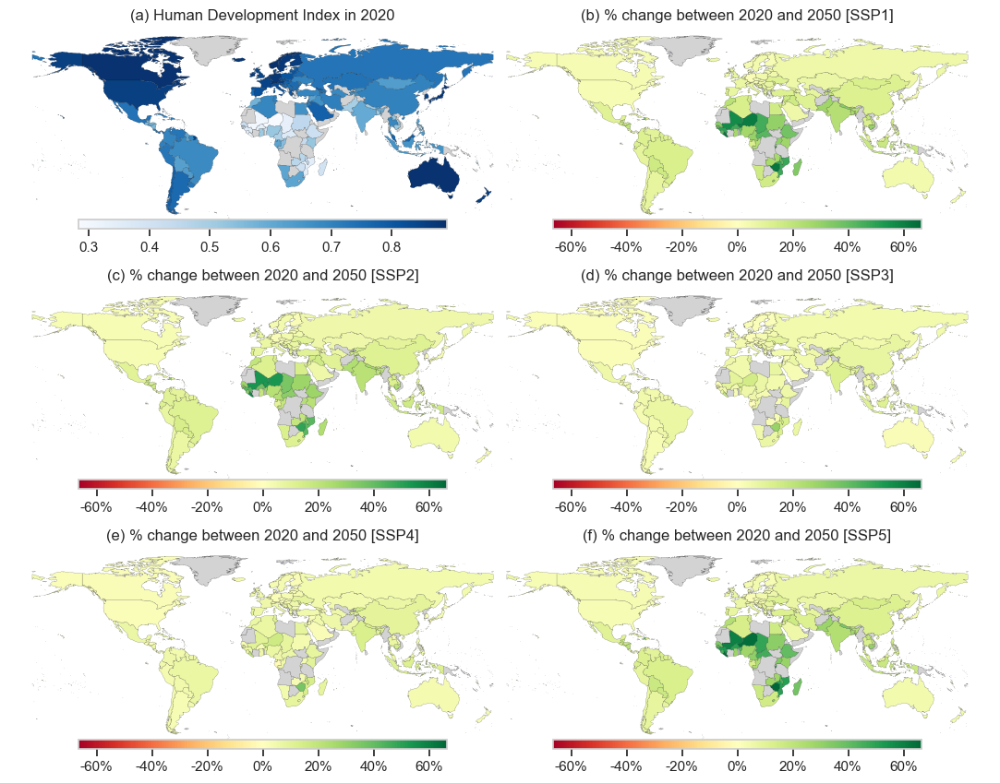

In [111]:
plot_map_by_scenario(df_ssp_ext,'Human Development Index',start=2020,end=2050,
                     file_name='figure_assumptions_change_hdi.png')

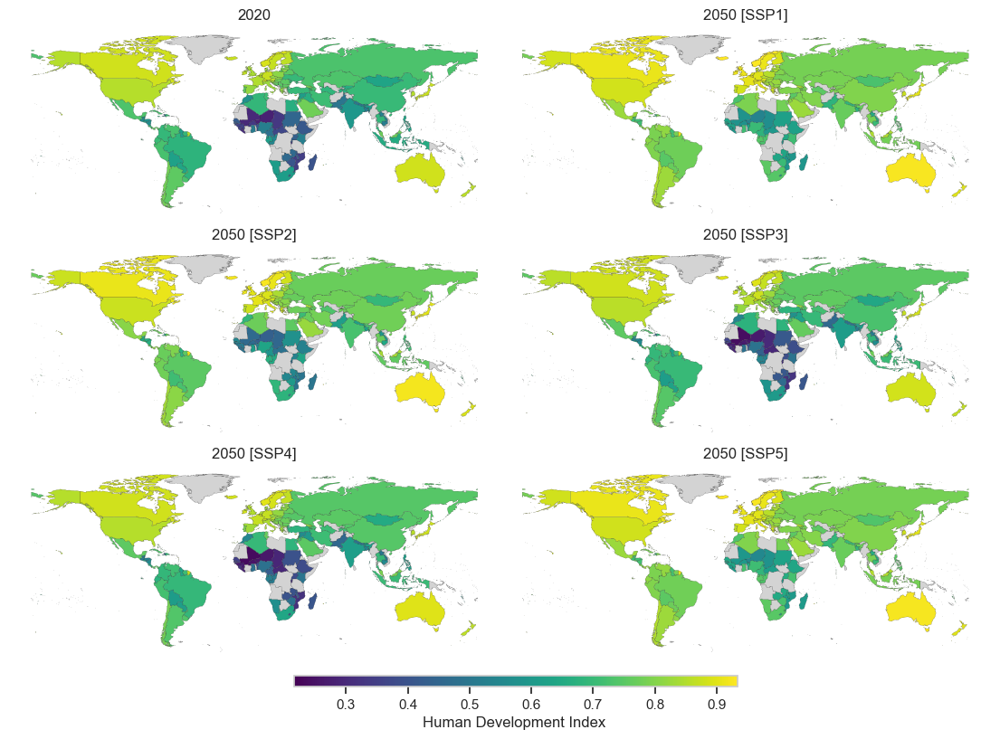

In [112]:
plot_year_comparison(df_ssp_ext,'Human Development Index',start=2020,end=2050,cmap='viridis',
                     file_name='figure_assumptions_years_hdi.png')

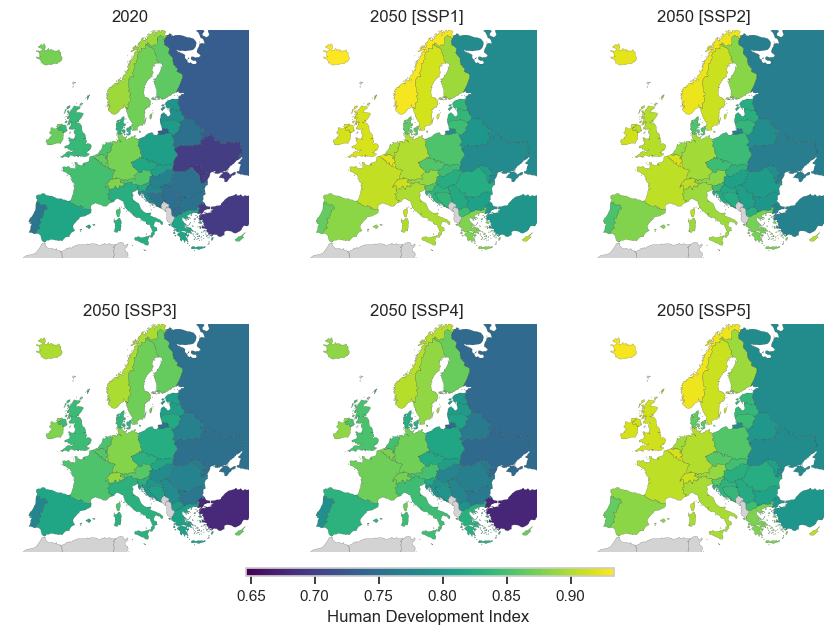

In [113]:
plot_year_comparison(df_ssp_ext,'Human Development Index',start=2020,end=2050,region=Europe,fig_cols=3, fig_rows=2,
                     eu_focus=True,file_name='figure_assumptions_EU_hdi.png')

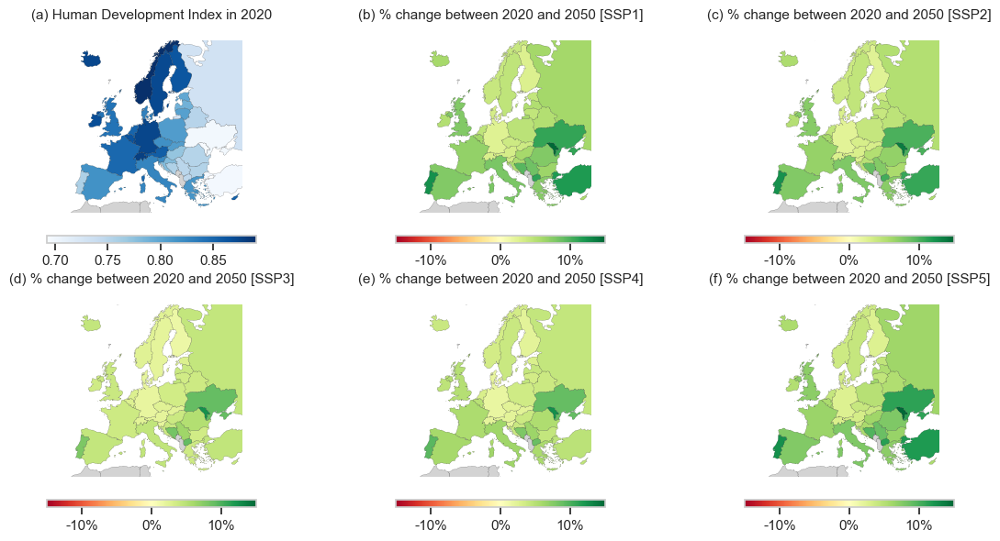

In [114]:
plot_map_by_scenario(df_ssp_ext,'Human Development Index',start=2020,end=2050,region=Europe,fig_cols=3, fig_rows=2,
                     eu_focus=True,file_name='figure_assumptions_EU_change_hdi.png')

In [115]:
edu_global = df_ssp.data\
    .drop(['variable','model','region','unit'],axis=1)\
    .groupby(['scenario','year'])\
    .mean()

<Axes: xlabel='year', ylabel='value'>

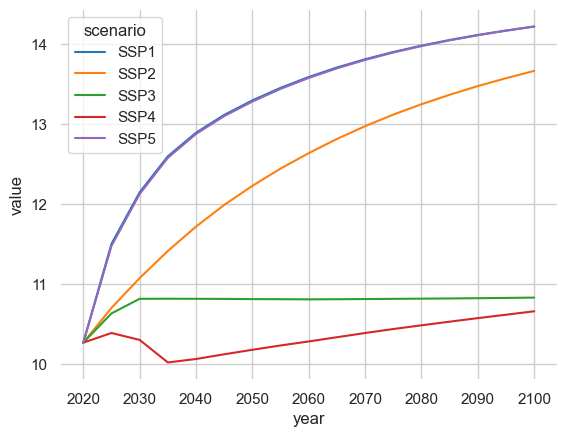

In [116]:
sns.lineplot(edu_global, x='year', y='value', hue='scenario')

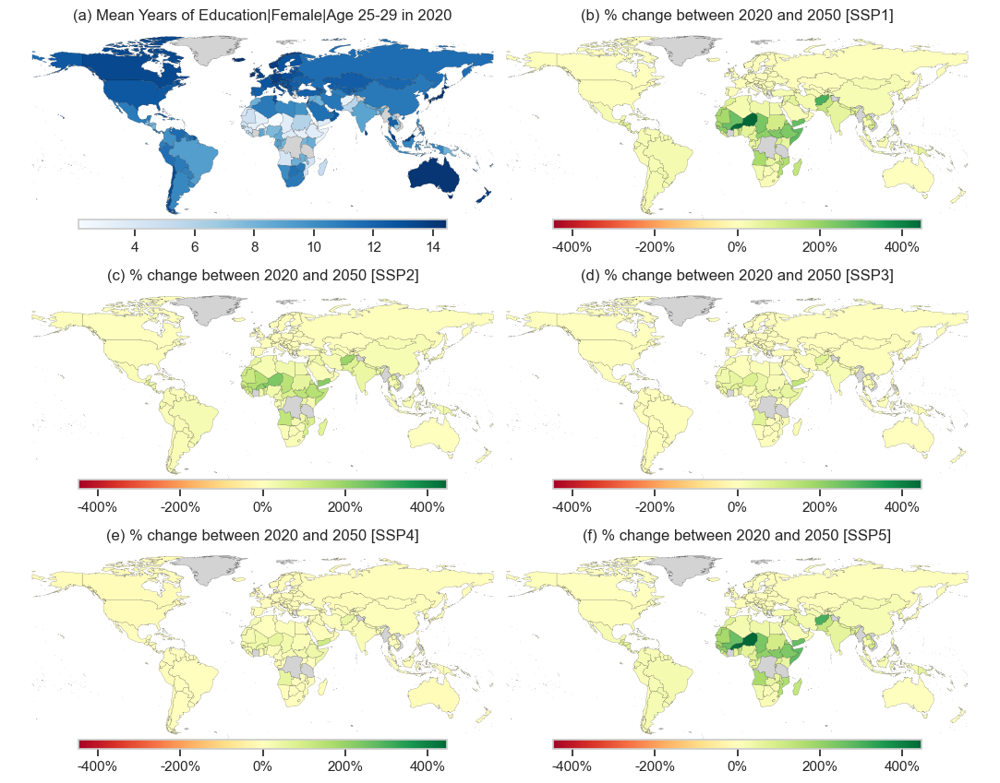

In [117]:
plot_map_by_scenario(df_ssp,'Mean Years of Education|Female|Age 25-29',start=2020,end=2050,
                     file_name='figure_assumptions_change_edu.png')

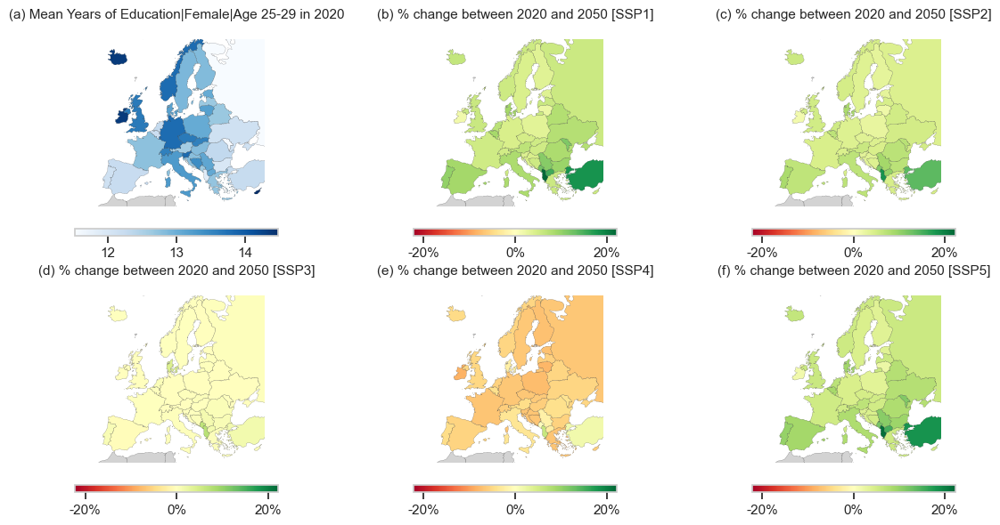

In [118]:
plot_map_by_scenario(df_ssp,'Mean Years of Education|Female|Age 25-29',start=2020,end=2050,region=Europe,
                     fig_cols=3, fig_rows=2, eu_focus=True, file_name='figure_assumptions_EU_change_edu.png')

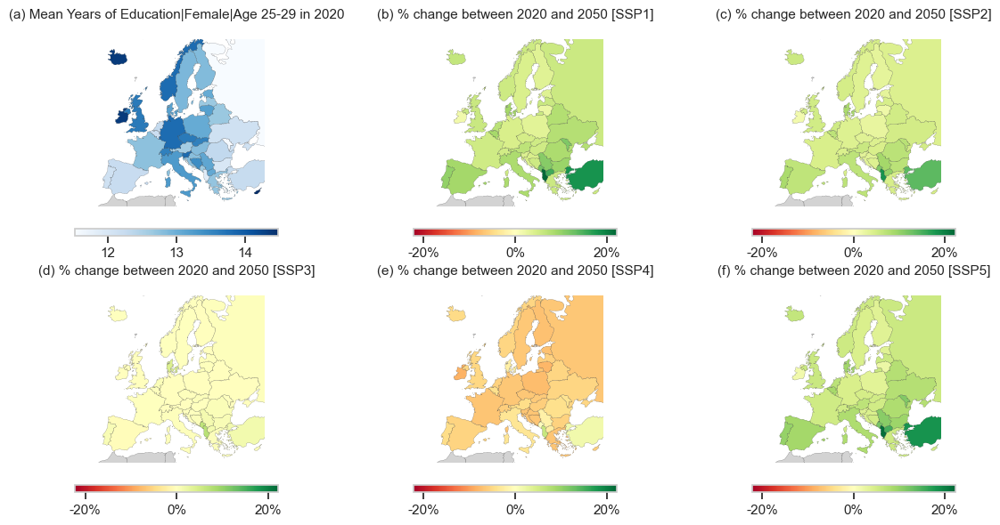

In [119]:
plot_map_by_scenario(df_ssp,'Mean Years of Education|Female|Age 25-29',start=2020,end=2050,region=Europe,
                     fig_cols=3, fig_rows=2, eu_focus=True, file_name='figure_assumptions_EU_change_edu.png')

### Representation

In [120]:
representation_vars = [
 'Gender Inequality Index',
 'Gini Income Inequality Coefficient',
]

Gender inequality can be a proxy for equal representation of the two genders.
- Globally, inequality seem to greatly reduce in all SSPs except SSP3. For SSP1 and SSP5, it even becomes zero by 2100.
- Same thing is shown for Europe and most countries in the world. It never seem to deteriorate anywhere.

Income inequality matches better with the patterns shown in the SSP narratives:
- Globally, it seems to improve with SSPs 1, 2, and 5 (especially the latter) and it deteriorates with SSPs 3, 4 (in the latter, this is shown in an unequal way)
- Same patterns are shown for Europe

<Axes: title={'center': 'model: Gender Inequality Model (2021) - region: World - variable: Gender Inequality Index'}, xlabel='Year', ylabel='Value'>

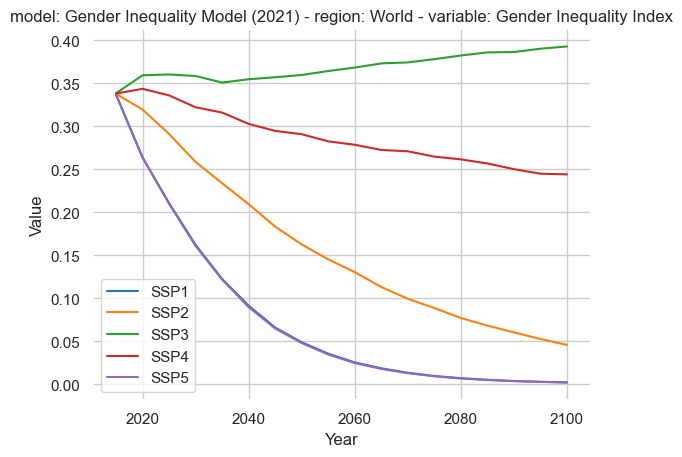

In [121]:
df_ssp_ext.filter(region='World',variable=['Gender Inequality Index']).plot()

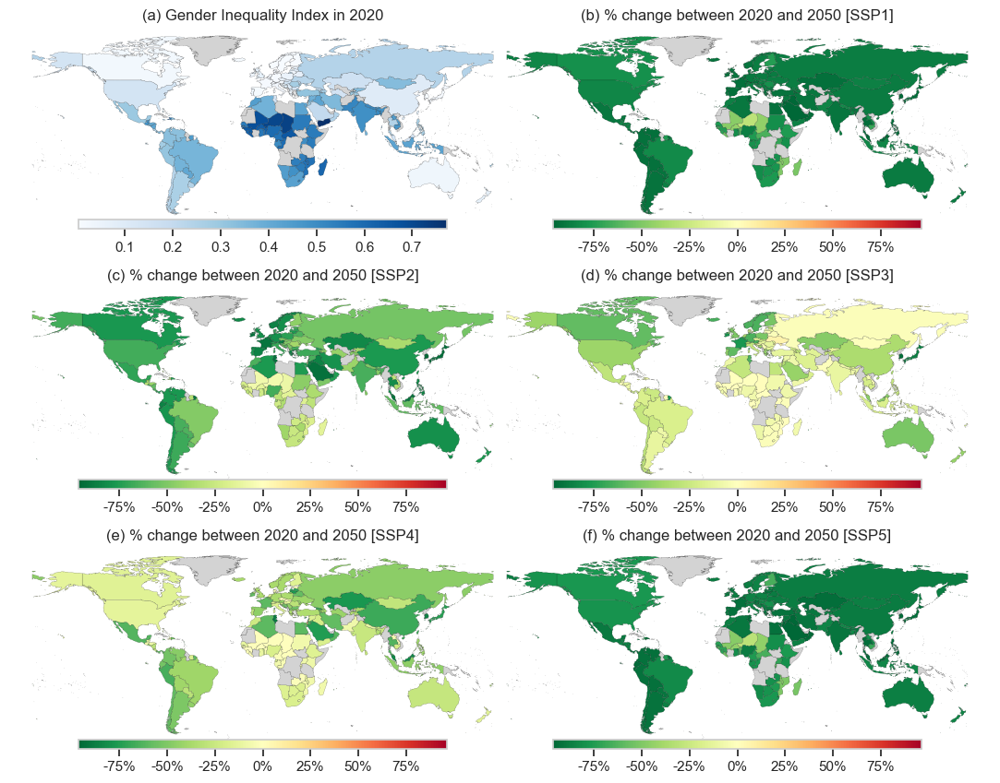

In [122]:
plot_map_by_scenario(df_ssp_ext,'Gender Inequality Index',start=2020,end=2050,
                     file_name='figure_assumptions_change_gender.png',cmap_change='RdYlGn_r')

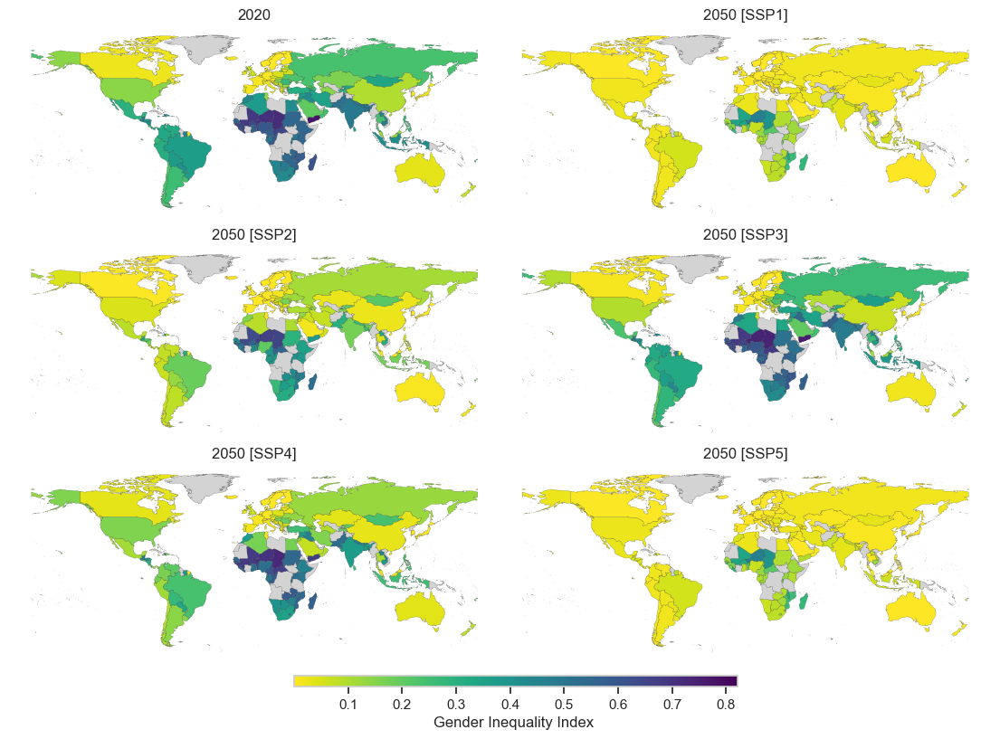

In [123]:
plot_year_comparison(df_ssp_ext,'Gender Inequality Index',start=2020,end=2050,cmap='viridis_r',
                     file_name='figure_assumptions_years_gender.png')

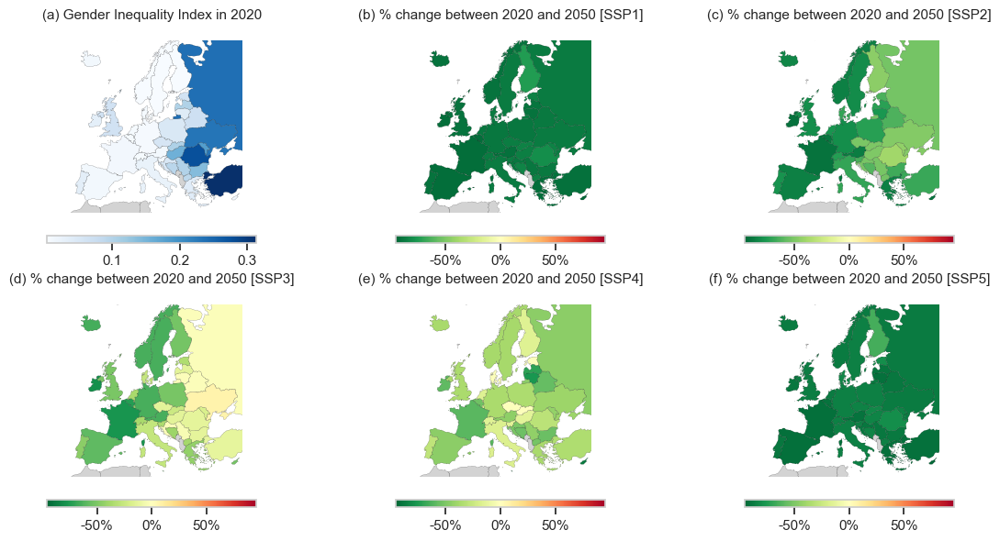

In [124]:
plot_map_by_scenario(df_ssp_ext,'Gender Inequality Index',start=2020,end=2050,region=Europe,
                     eu_focus=True,fig_cols=3, fig_rows=2,cmap_change='RdYlGn_r',
                     file_name='figure_assumptions_EU_change_gender.png')

### Accountability

In [125]:
accountability_vars = [
 'Governance Index|Control of Corruption',
 'Governance Index|Control of Corruption [unweighted mean]',
 'Governance Index|Control of Corruption [weighted by GDP]',
 'Governance Index|Control of Corruption [weighted by Population]', 
 'Rule-of-Law Index',
 'Rule-of-Law Index [unweighted mean]',
 'Rule-of-Law Index [weighted by GDP]',
 'Rule-of-Law Index [weighted by Population]',
]

- Both control of corruption and rule of law seem to improve globally by 2050 for all SSPs despite what it is implied by the narratives.
- Biggest improvements can be found in African and Asian countries
- In Europe, rule of law seem to slightly deteriorate (with the exception of Turkey and Ukraine) while control of corruption seems to improve, especially for Eastern Europe.

<Axes: title={'center': 'model: Governance Model (2020) - region: World - variable: Governance Index|Control of Corruption [unweighted mean]'}, xlabel='Year', ylabel='Value'>

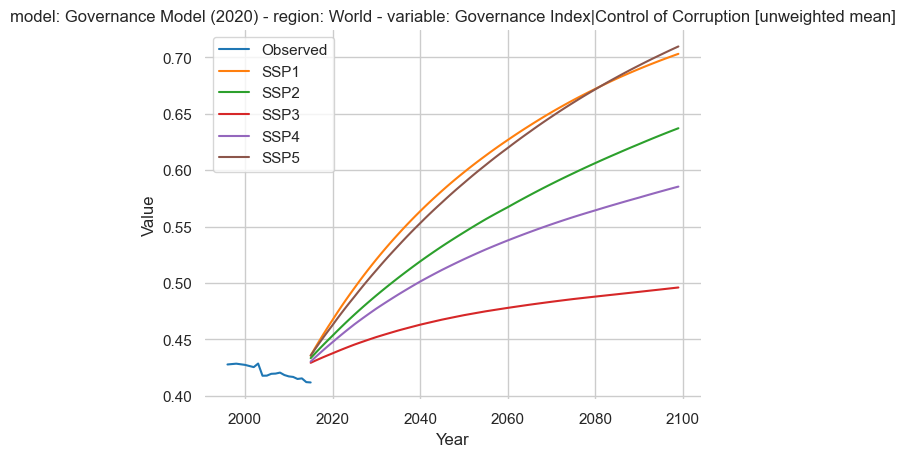

In [126]:
df_ssp_ext.filter(region='World',variable=['Governance Index|Control of Corruption [unweighted mean]']).plot()

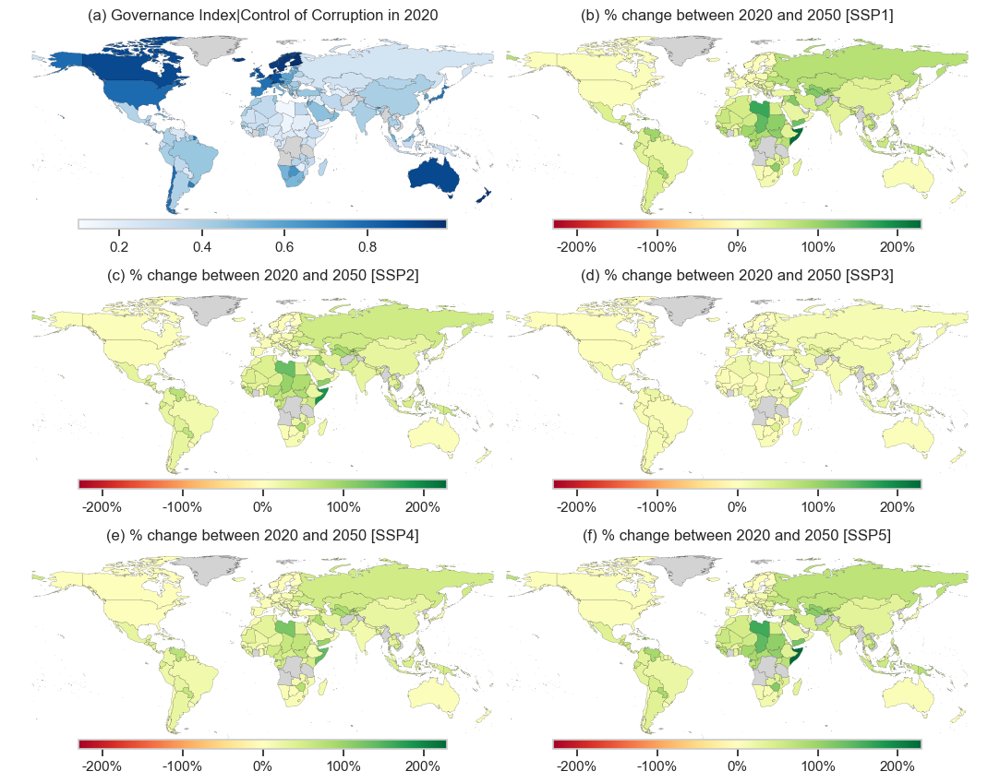

In [127]:
plot_map_by_scenario(df_ssp_ext,'Governance Index|Control of Corruption',start=2020,end=2050,
                     file_name='figure_assumptions_change_corruption.png')

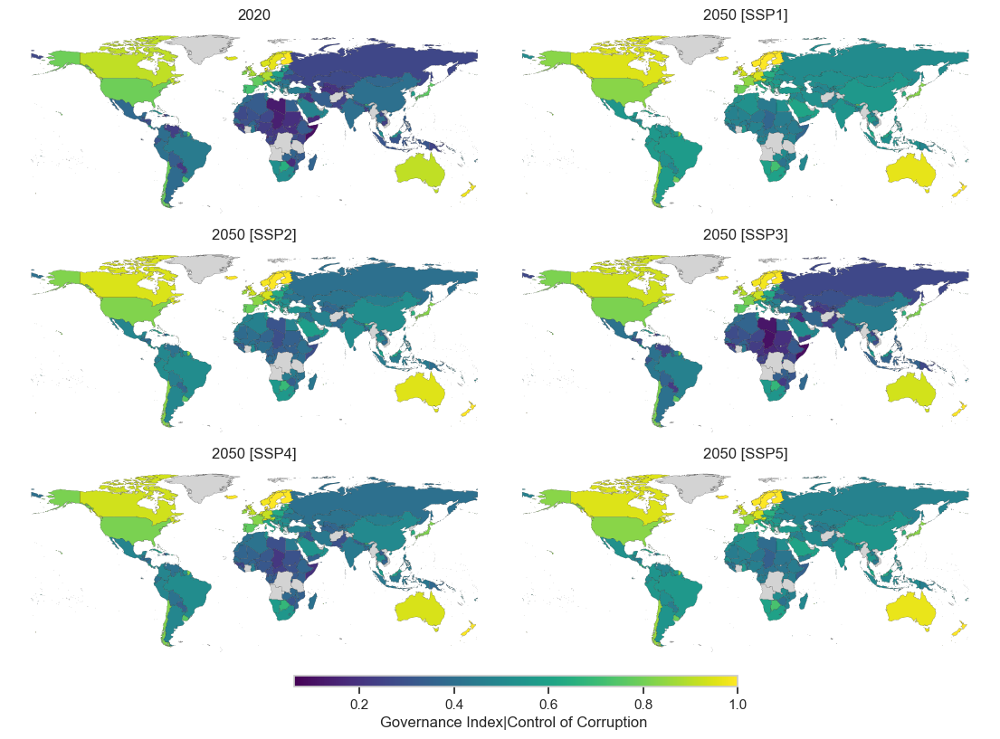

In [128]:
plot_year_comparison(df_ssp_ext,'Governance Index|Control of Corruption',start=2020,end=2050,cmap='viridis',
                     file_name='figure_assumptions_years_corruption.png')

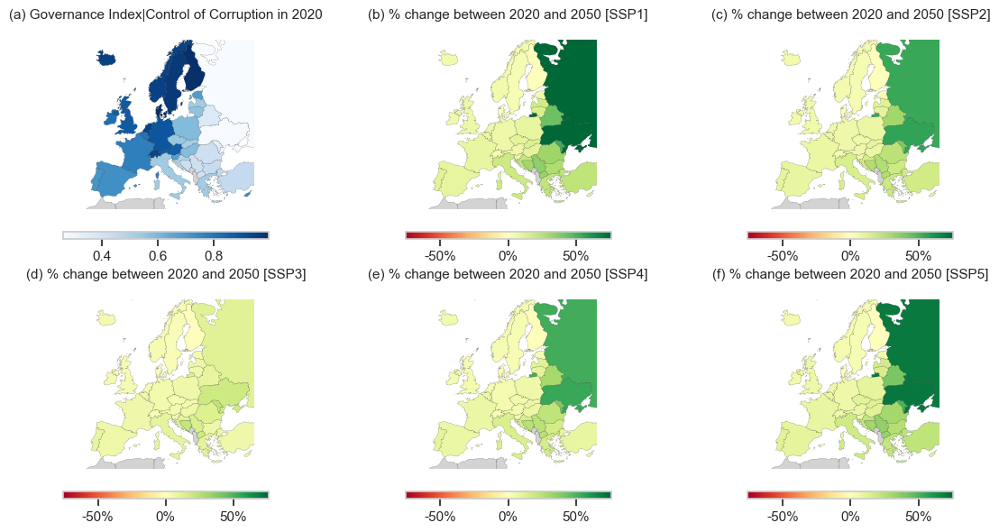

In [129]:
plot_map_by_scenario(df_ssp_ext,'Governance Index|Control of Corruption',start=2020,end=2050,
                     region=Europe,eu_focus=True, fig_cols=3, fig_rows=2,
                     file_name='figure_assumptions_EU_change_corruption.png')

<Axes: title={'center': 'model: Rule of Law Model (2021) - region: World - variable: Rule-of-Law Index [unweighted mean]'}, xlabel='Year', ylabel='Value'>

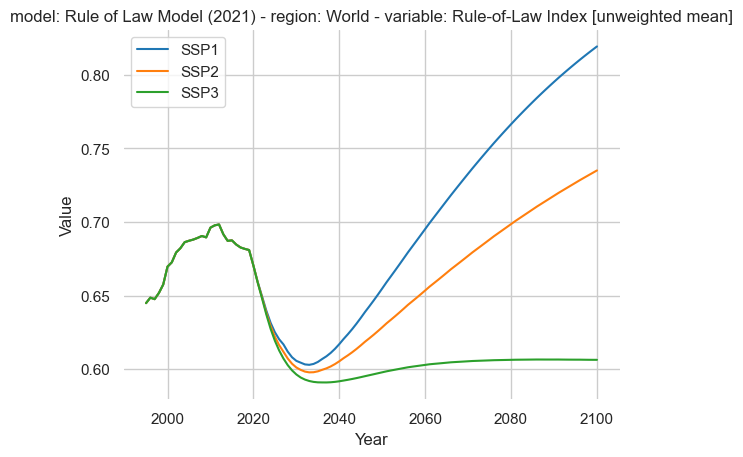

In [130]:
df_ssp_ext.filter(region='World',variable=['Rule-of-Law Index [unweighted mean]']).plot()

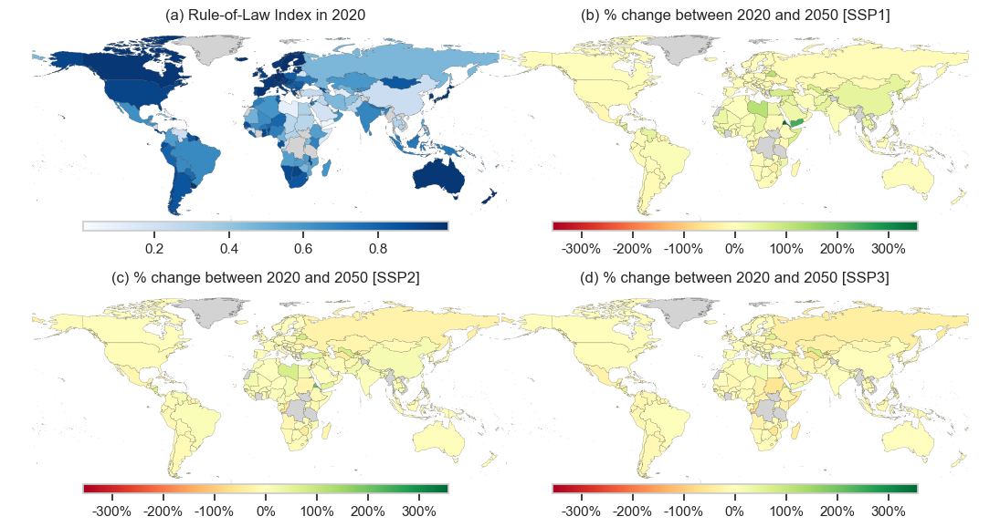

In [131]:
plot_map_by_scenario(df_ssp_ext,'Rule-of-Law Index',start=2020,end=2050,fig_rows=2,
                     file_name='figure_assumptions_change_rule_of_law.png')

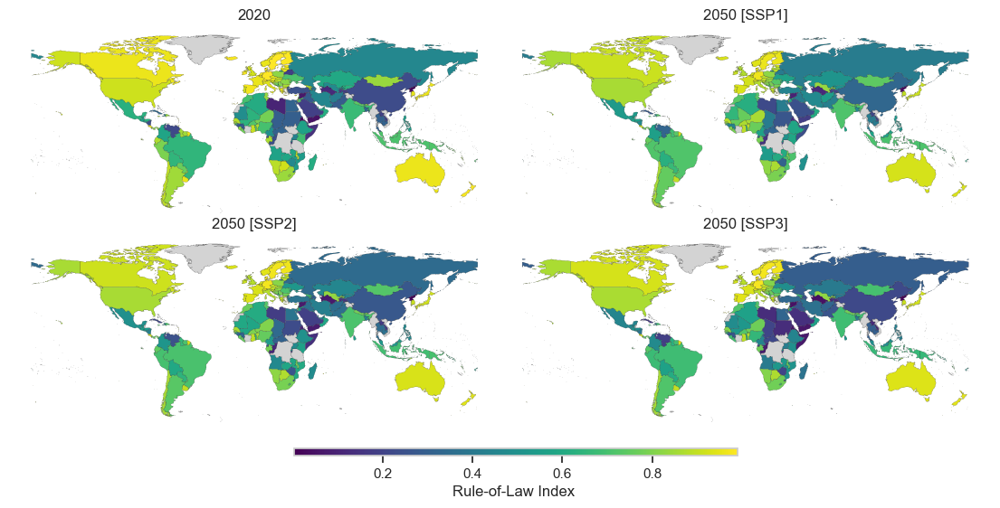

In [132]:
plot_year_comparison(df_ssp_ext,'Rule-of-Law Index',start=2020,end=2050,fig_rows=2,cmap='viridis',
                     file_name='figure_assumptions_years_rule_of_law.png')

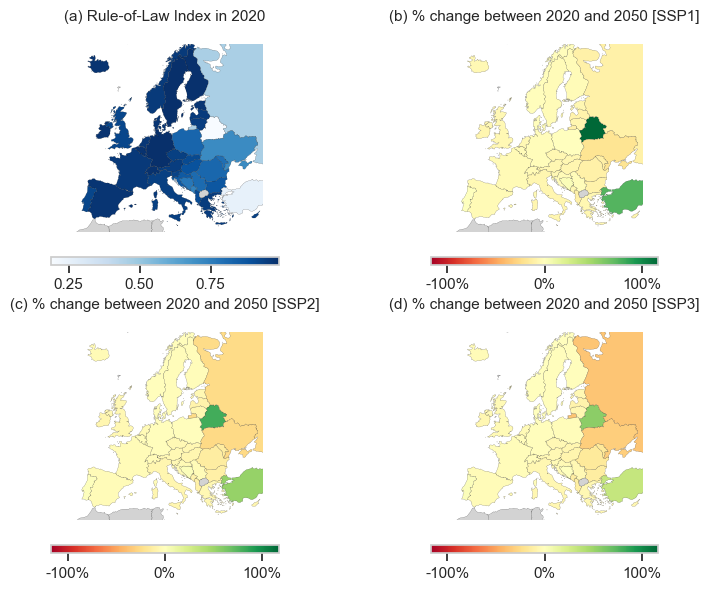

In [133]:
plot_map_by_scenario(df_ssp_ext,'Rule-of-Law Index',start=2020,end=2050,
                     region=Europe,eu_focus=True, fig_cols=2, fig_rows=2,
                     file_name='figure_assumptions_EU_change_rule_of_law.png')

### Knowledge & expertise

Definition: Knowledge and expertise, and their use in informing policy, are important elements of democratic practice.
Ensuring that decision-making processes and outcomes are informed by diverse sources of knowledge,
including but not limited to state-of-the-art science, is particularly important to climate governance and is
increasingly under threat

Maybe in our case, a proxy could be whether climate policy is science-based, i.e., whether the scenario is 1.5 or 2C?

How difficult is to reach the targets in other SSPs?

In [134]:
ambitious_cats = ['C1','C2','C3']

In [135]:
ambitious_cats_names = np.sort(df_ar6_meta_vet.Category_name.unique())[:3]

In [136]:
df_meta_ambitious = df_ar6_meta_vet[df_ar6_meta_vet['Category'].isin(ambitious_cats)]

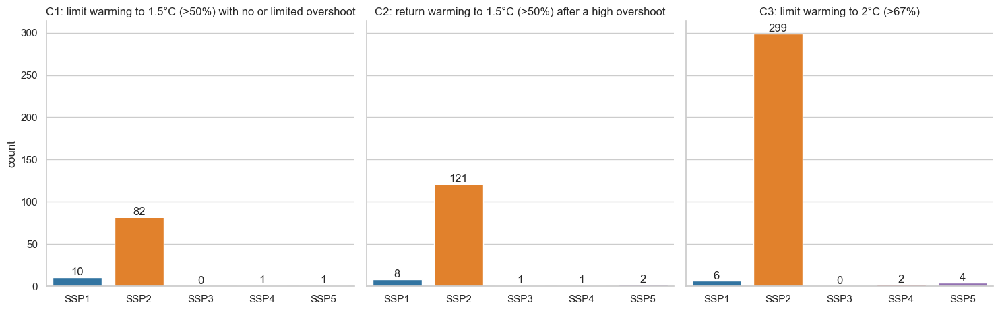

In [137]:
g =sns.catplot(data=df_meta_ambitious, x='Ssp_family', col='Category_name', col_wrap=3, col_order = ambitious_cats_names,
               kind='count')
for ax in g.axes.flat:
    ax.bar_label(ax.containers[0])
    ax.set_xlabel('')
g.set_titles('{col_name}')
g.set_xticklabels(['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5'])

In [138]:
df_ar6_meta_vet.groupby(['Ssp_family','Category']).count()['Model']

Ssp_family  Category
1.0         C1           10
            C2            8
            C3            6
            C4            2
            C5           14
            C6            8
            C7            6
2.0         C1           82
            C2          121
            C3          299
            C4          155
            C5          192
            C6           83
            C7          145
            C8           17
3.0         C2            1
            C4            1
            C5            2
            C6            2
            C7            3
            C8            2
4.0         C1            1
            C2            1
            C3            2
            C5            2
            C6            2
            C7            6
5.0         C1            1
            C2            2
            C3            4
            C4            1
            C5            2
            C6            2
            C7            3
            C8           10

### Deliberativess

Very difficult to measure with existing indicators, maybe look at conflict measures?

### Effectiveness

In [139]:
effectiveness_vars = [
 'Governance Index',
 'Governance Index [unweighted mean]',
 'Governance Index|Government Effectiveness',
 'Governance Index|Government Effectiveness [unweighted mean]',
]

Effectiveness can be measured in several ways. In a general sense, one measure of effectiveness is whether
a democratic system produces its targeted/intended outputs and outcomes (Lindvall and Karlsson 2024).
Outputs include things like laws and policies, and outcomes are the goals of those laws and policies (and
international agreements) being realised. Similarly, democracies can be evaluated according to the quality of
their processes in relation to aspects like participation, representation, and accountability.

- As with control of corruption, this is very optimistic
- In all SSPs and for all countries, governance improves or at worst it is stagnated.
- This follows the same pattern as with GDP since the main driver of effectiveness is GDP.

<Axes: title={'center': 'model: Governance Model (2020) - region: World - variable: Governance Index [unweighted mean]'}, xlabel='Year', ylabel='Value'>

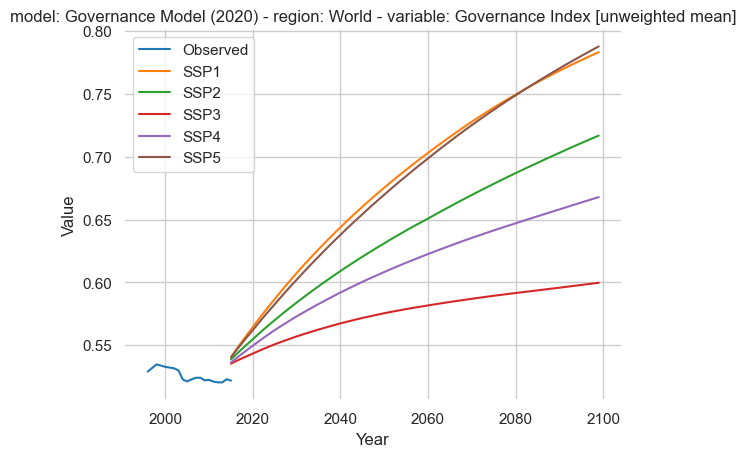

In [140]:
df_ssp_ext.filter(region='World',variable=['Governance Index [unweighted mean]']).plot()

<Axes: title={'center': 'model: Governance Model (2020) - region: World - variable: Governance Index|Government Effectiveness [unweighted mean]'}, xlabel='Year', ylabel='Value'>

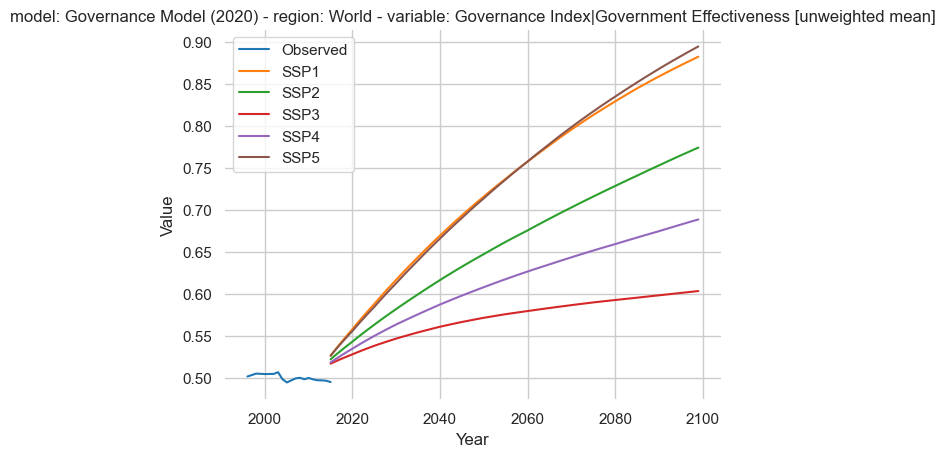

In [141]:
df_ssp_ext.filter(region='World',variable=['Governance Index|Government Effectiveness [unweighted mean]']).plot()

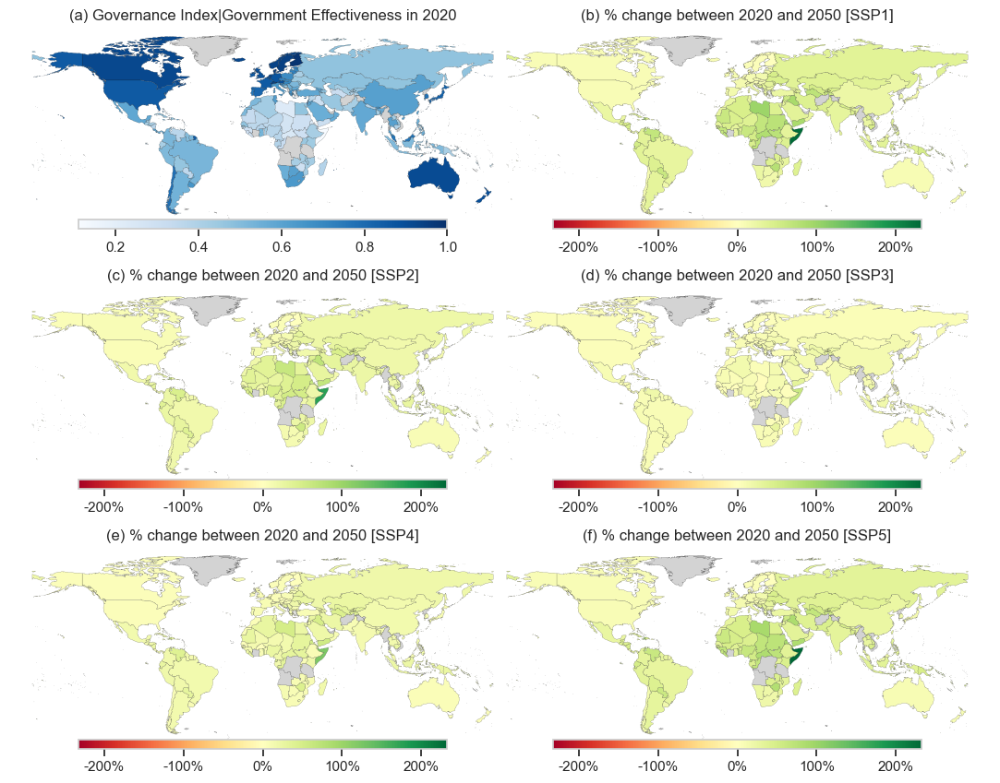

In [142]:
plot_map_by_scenario(df_ssp_ext,'Governance Index|Government Effectiveness',start=2020,end=2050,
                     file_name='figure_assumptions_change_effectiveness.png')

In [143]:
df_ssp_ext.filter(variable='Gini Income Inequality Coefficient',year=2050,scenario='SSP1',region='China').data.describe()

,year,value
count,1.0,1.000
mean,2050.0,33.641
std,NaN,NaN
min,2050.0,33.641
25%,2050.0,33.641
50%,2050.0,33.641
75%,2050.0,33.641
max,2050.0,33.641


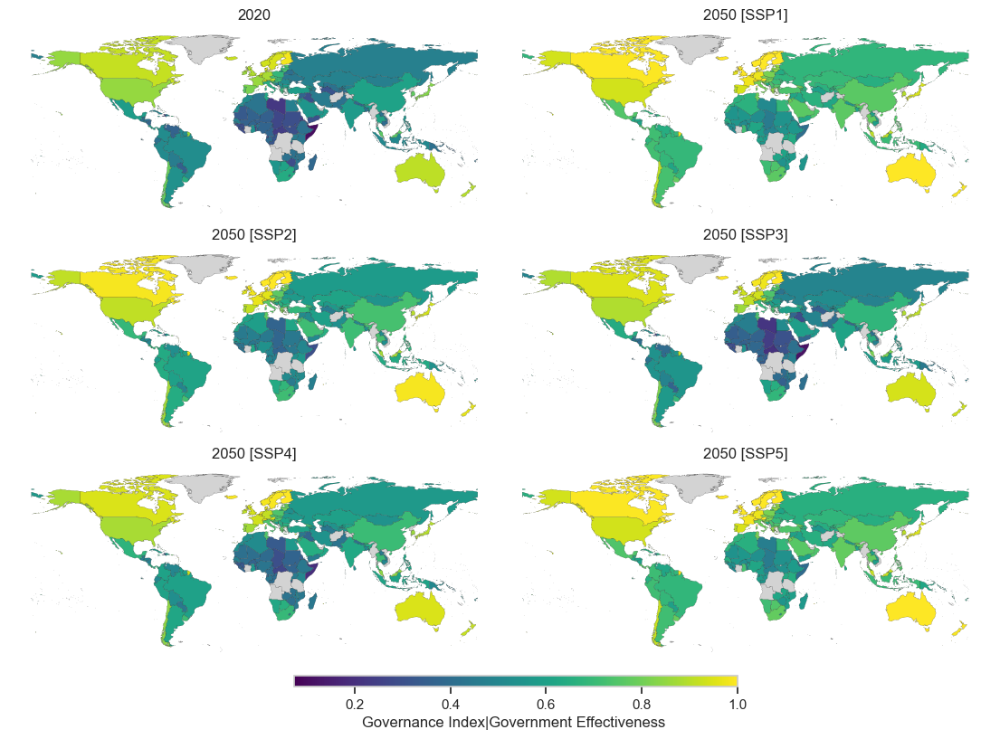

In [144]:
plot_year_comparison(df_ssp_ext,'Governance Index|Government Effectiveness',start=2020,end=2050,
                     file_name='figure_assumptions_years_effectiveness.png')

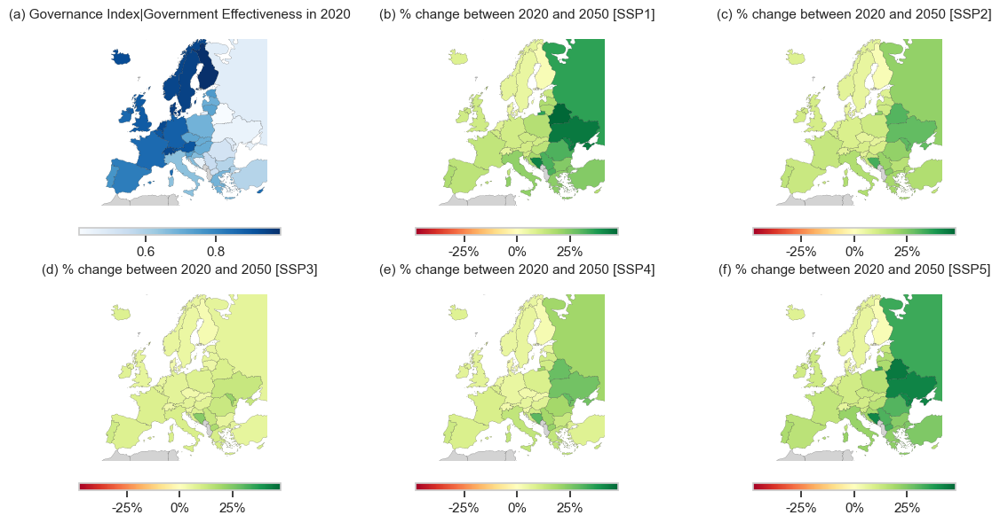

In [145]:
plot_map_by_scenario(df_ssp_ext,'Governance Index|Government Effectiveness',start=2020,end=2050,
                     region=Europe,eu_focus=True, fig_cols=3, fig_rows=2,
                     file_name='figure_assumptions_EU_change_effectiveness.png')

<Axes: title={'center': 'region: World - variable: GDP|PPP'}, xlabel='Year', ylabel='billion USD_2017/yr'>

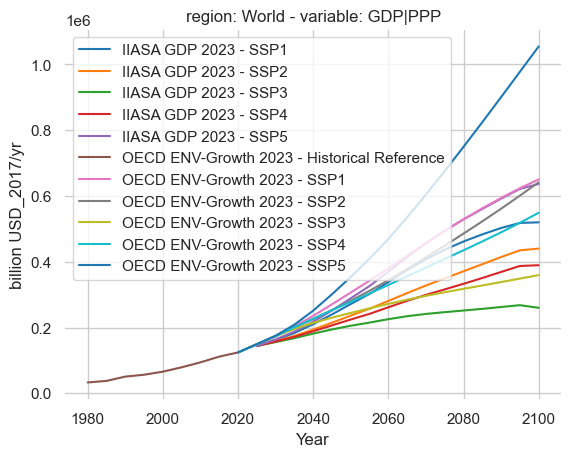

In [146]:
df_ssp_gdp.filter(region='World').plot()

In [147]:
df_ssp_gdp

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : IIASA GDP 2023, OECD ENV-Growth 2023 (2)
 * scenario : Historical Reference, SSP1, SSP2, SSP3, SSP4, SSP5 (6)
Timeseries data coordinates:
   region   : Afghanistan, Africa (R10), Albania, Algeria, ... Zimbabwe (221)
   variable : GDP|PPP, GDP|PPP [per capita] (2)
   unit     : USD_2017/yr, billion USD_2017/yr (2)
   year     : 1950, 1955, 1960, 1965, 1970, 1975, 1980, 1985, ... 2100 (31)
Meta indicators:
   exclude (bool) False (1)

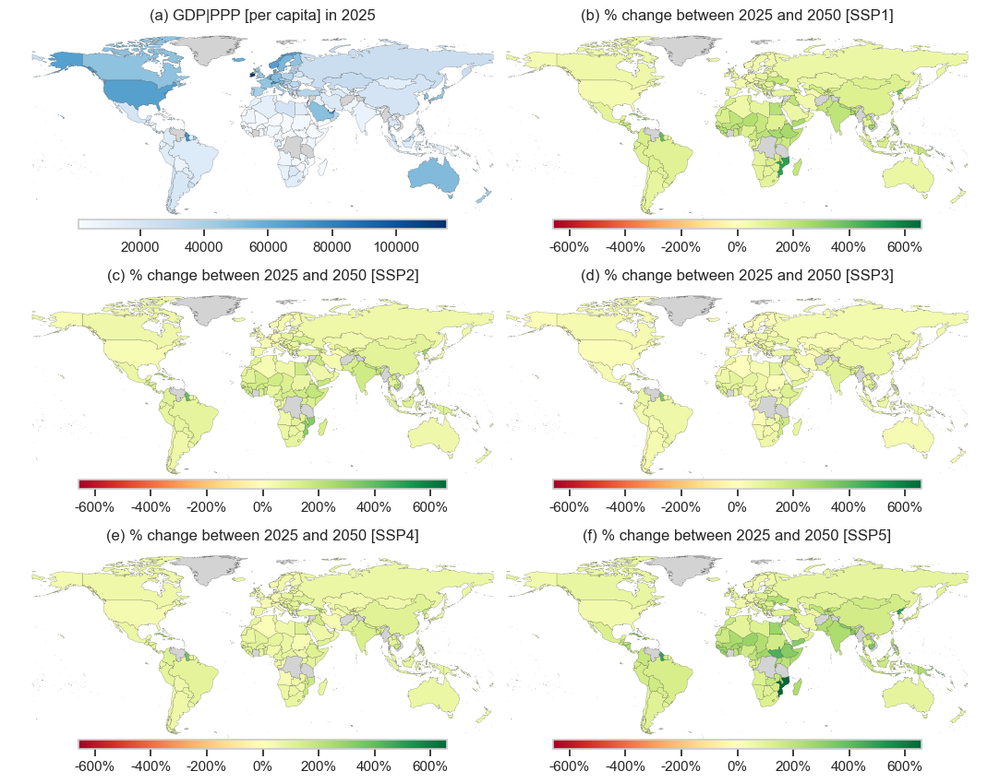

In [148]:
plot_map_by_scenario(df_ssp_gdp.filter(model='OECD ENV-Growth 2023'),'GDP|PPP [per capita]',start=2025,end=2050,
                     file_name='figure_assumptions_change_gdp.png')

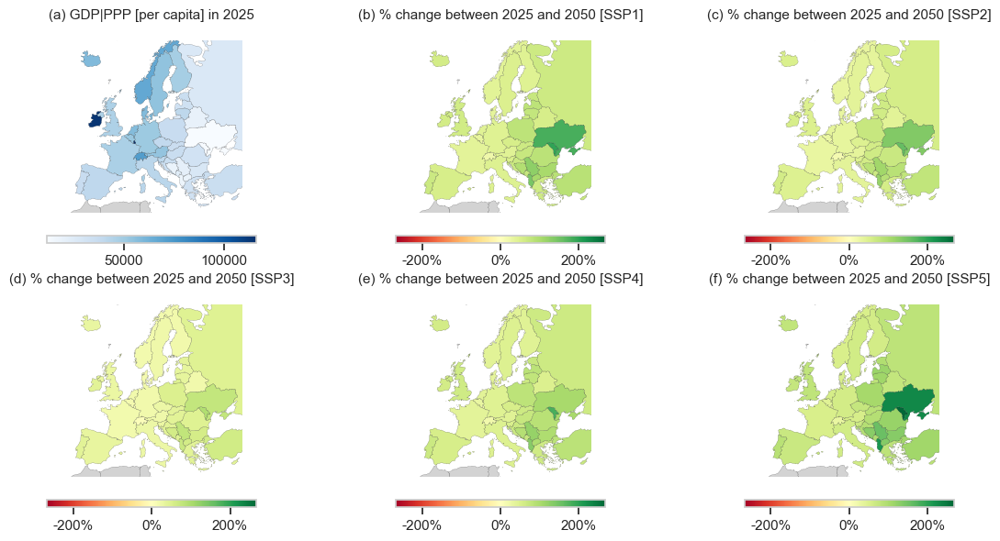

In [149]:
plot_map_by_scenario(df_ssp_gdp.filter(model='OECD ENV-Growth 2023'),'GDP|PPP [per capita]',start=2025,end=2050,
                     region=Europe,eu_focus=True, fig_cols=3, fig_rows=2,
                     file_name='figure_assumptions_EU_change_gdp.png')

### Justice

In [150]:
justice_vars = [
    'Population|Extreme Poverty',
    'Population|Risk of Hunger',
    'Gini Income Inequality Coefficient'
]

Justice is a multidimensional concept that includes elements of equality, self-determination, sovereignty, human rights and access (Schlosberg and Collins 2014). This includes access to justice, which is usually considered as being able to make use of the legal system, and while that is very important, a larger view of justice goes beyond it (Pickering 2020; Palombella 2021).  
 
In the context of climate change, justice has been defined as that which links human rights and development to achieve a human-centred approach, safeguarding the rights of the most vulnerable people and sharing the burdens and benefits of climate change and its impacts equitably and fairly (Mary Robinson Foundation for Climate Justice 2022). We look at:
- Distributional justice (or equity)
- Procedural justice
- Recognitional justice
- Corrective justice
- Transitional justice

**Analysis**
- As with the rest, this is very optimistic
- Extreme poverty and risk of hunger are reduced in most SSPs (even goes to zero with SSP1 and SSP2), with the exception of SSP3 and SSP4 where they persist in their current levels for the rest of the decade.
- For extreme poverty, reduction is uniform in most countries apart from some exceptions such as Libya.
- This potentially follows the same pattern as with GDP that grows in most cases.

<Axes: title={'center': 'model: Poverty Model (2018) - region: World - variable: Population|Extreme Poverty'}, xlabel='Year', ylabel='million'>

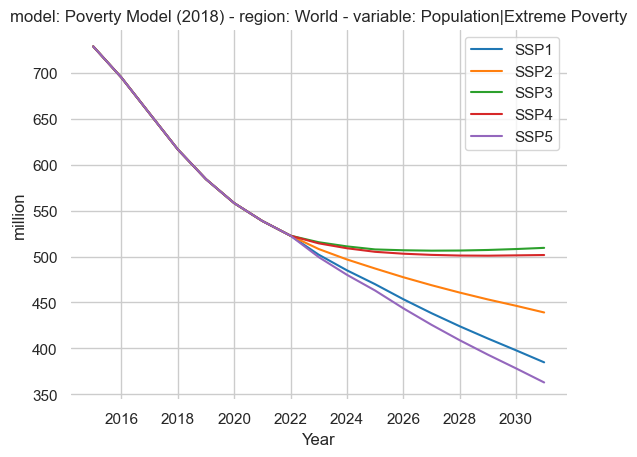

In [151]:
df_ssp_ext.filter(region='World',variable=['Population|Extreme Poverty']).plot()

<Axes: title={'center': 'model: AIM/CGE 2.1 - region: World - variable: Population|Risk of Hunger'}, xlabel='Year', ylabel='million'>

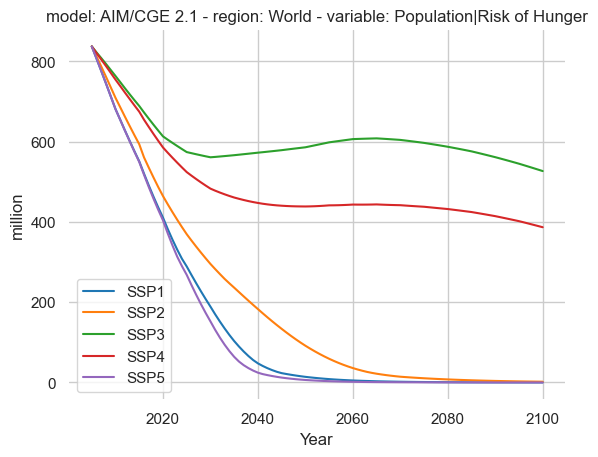

In [152]:
df_ssp_ext.filter(region='World',variable=['Population|Risk of Hunger']).plot()

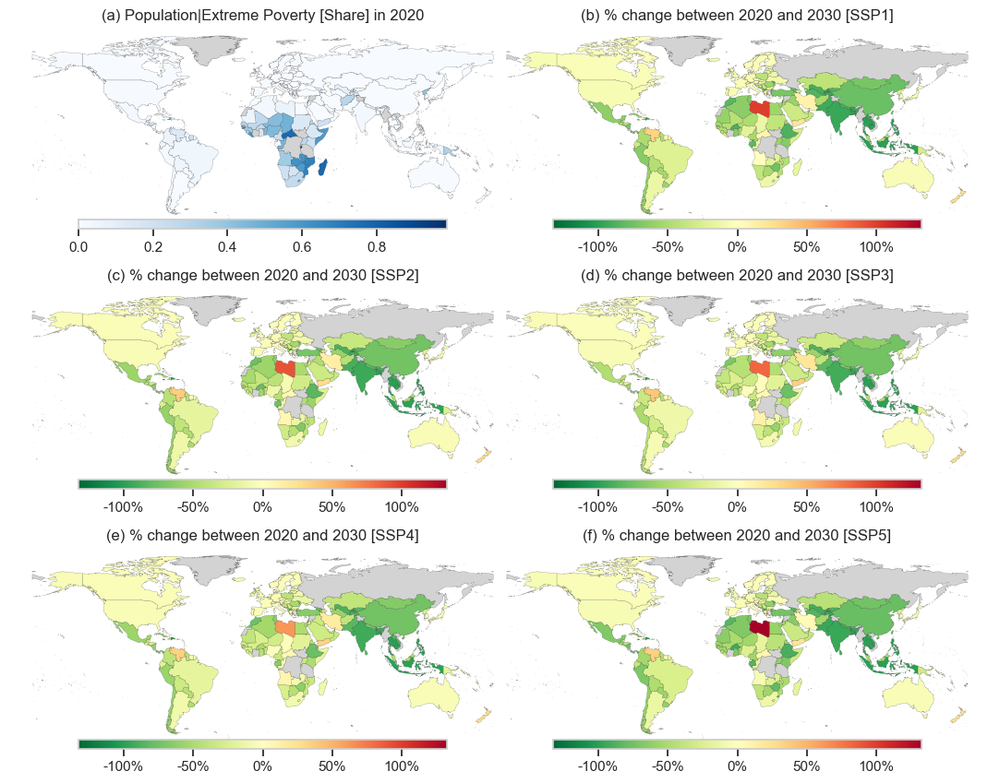

In [153]:
plot_map_by_scenario(df_ssp_ext,'Population|Extreme Poverty [Share]',start=2020,end=2030,
                     file_name='figure_assumptions_change_poverty.png',cmap_change = 'RdYlGn_r')

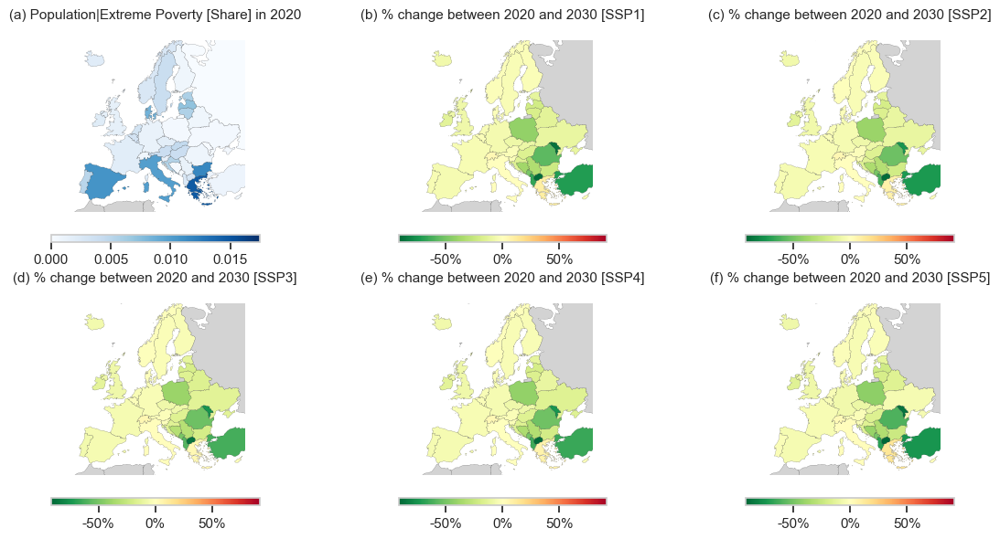

In [154]:
plot_map_by_scenario(df_ssp_ext,'Population|Extreme Poverty [Share]',start=2020,end=2030,
                     region=Europe, eu_focus=True, fig_cols=3, fig_rows=2,
                     file_name='figure_assumptions_EU_change_poverty.png',cmap_change = 'RdYlGn_r')

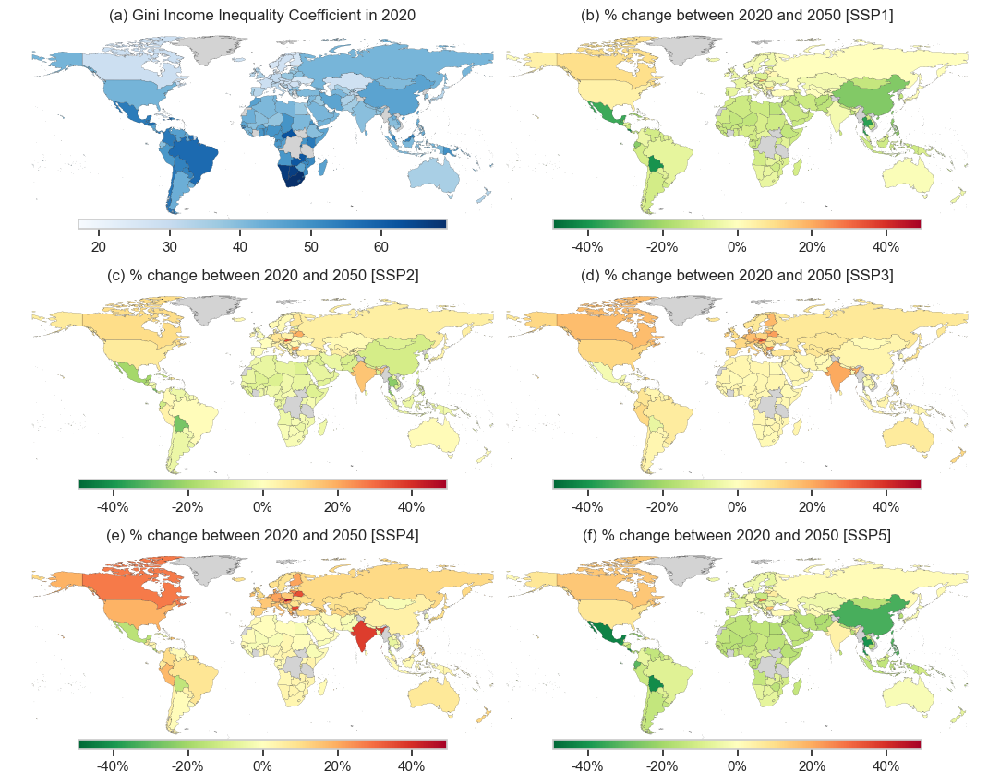

In [155]:
plot_map_by_scenario(df_ssp_ext,'Gini Income Inequality Coefficient',start=2020,end=2050,
                     file_name='figure_assumptions_change_gini.png',cmap_change = 'RdYlGn_r')

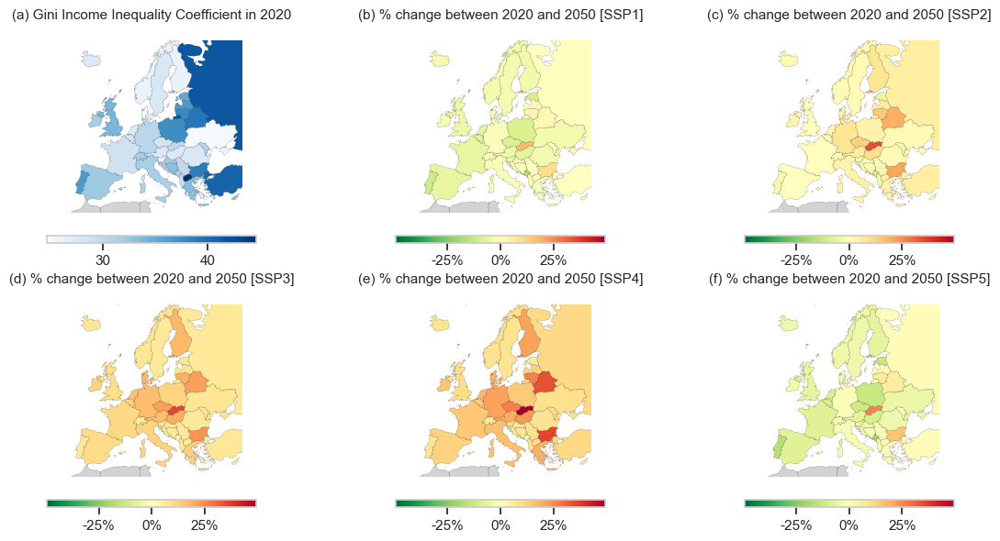

In [156]:
plot_map_by_scenario(df_ssp_ext,'Gini Income Inequality Coefficient',start=2020,end=2050,
                    region=Europe, eu_focus=True, fig_cols=3, fig_rows=2,
                     file_name='figure_assumptions_EU_change_gini.png',cmap_change = 'RdYlGn_r')

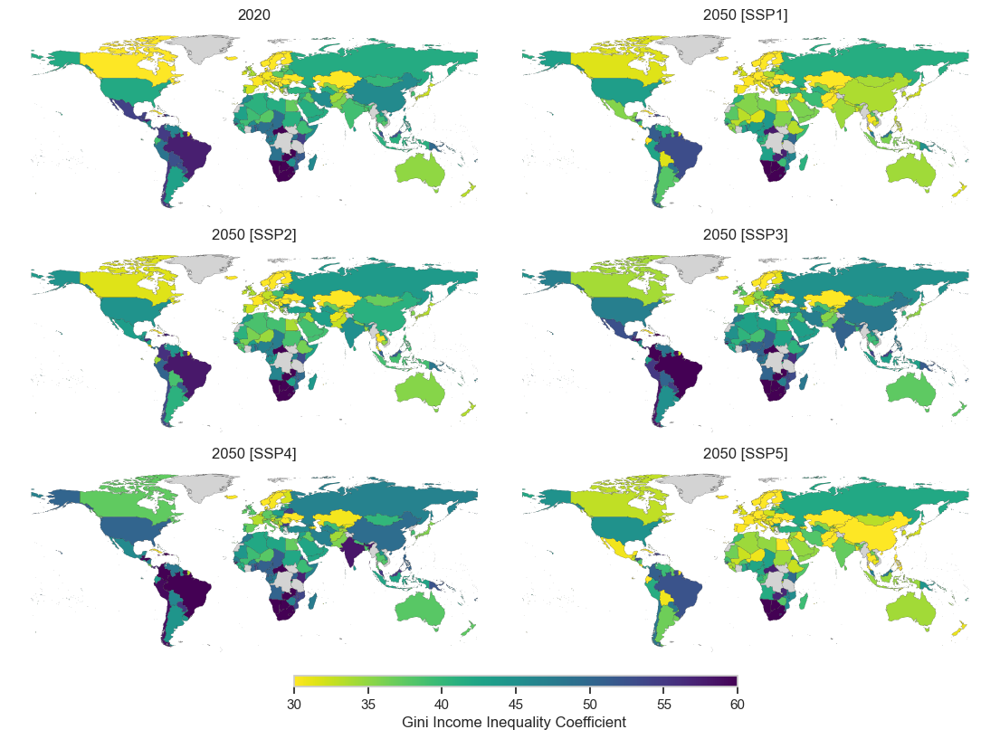

In [157]:
plot_year_comparison(df_ssp_ext,'Gini Income Inequality Coefficient',start=2020,end=2050,cmap='viridis_r',
                     file_name='figure_assumptions_years_gini.png',y_range=[30,60])

## Assumptions vs impacts

- For some democracy indicators, the relationships between them and the emissions seem logical
- In others, like RES share, there is no clear relationship
- Still, these are based on many assumptions as it can be that countries that have now high efficiency (e.g., EU), need for reducing emissions.

In [158]:
assumptions_assessed

['Human Development Index [unweighted mean]',
 'Gender Inequality Index',
 'Rule-of-Law Index [unweighted mean]',
 'Governance Index|Government Effectiveness [unweighted mean]',
 'Governance Index|Control of Corruption [unweighted mean]',
 'Gini Income Inequality Coefficient [unweighted mean]',
 'Population|Extreme Poverty [Share]']

### Participation

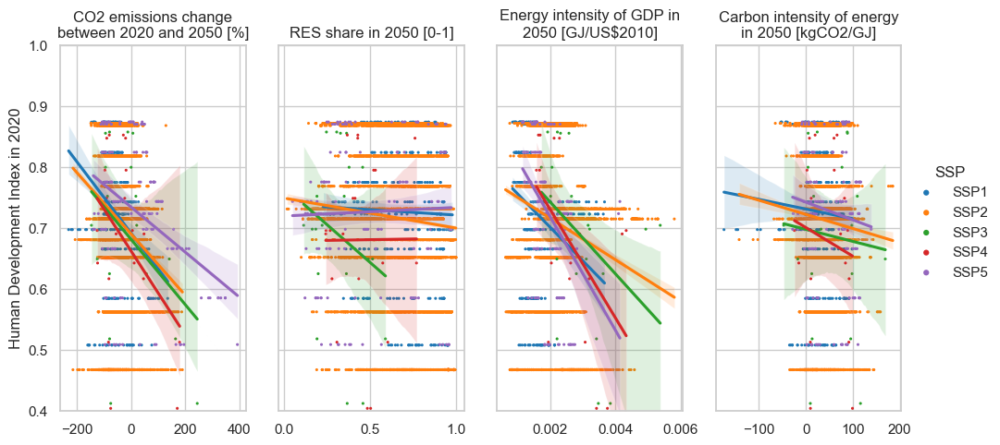

In [159]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Human Development Index [unweighted mean]',
    label_assumption='Human Development Index',
    year_assumption=2020,
    year_impact=2050,
    ylim=[0.4,1],
    file_name='figure_impacts_hdi.png'
)

### Representation

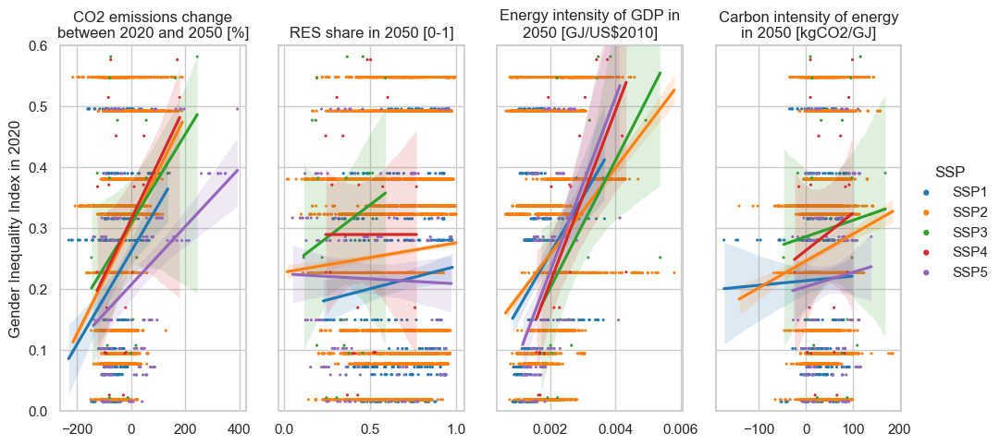

In [160]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Gender Inequality Index',
    year_assumption=2020,
    year_impact=2050,
    ylim=[0,0.6],
    file_name='figure_impacts_gender.png'
)

### Accountability

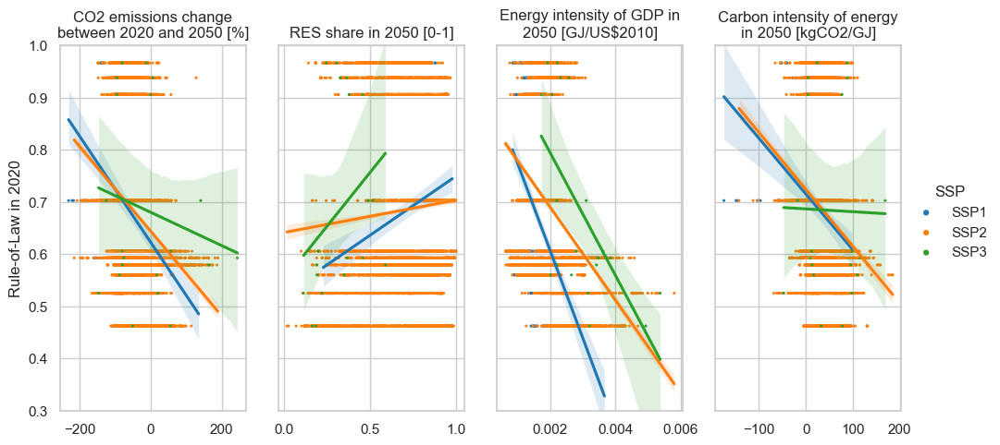

In [161]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Rule-of-Law Index [unweighted mean]',
    label_assumption='Rule-of-Law',
    year_assumption=2020,
    year_impact=2050,
    ssp_order=ssp_order[:3],
    file_name='figure_impacts_rule_of_law.png'
)

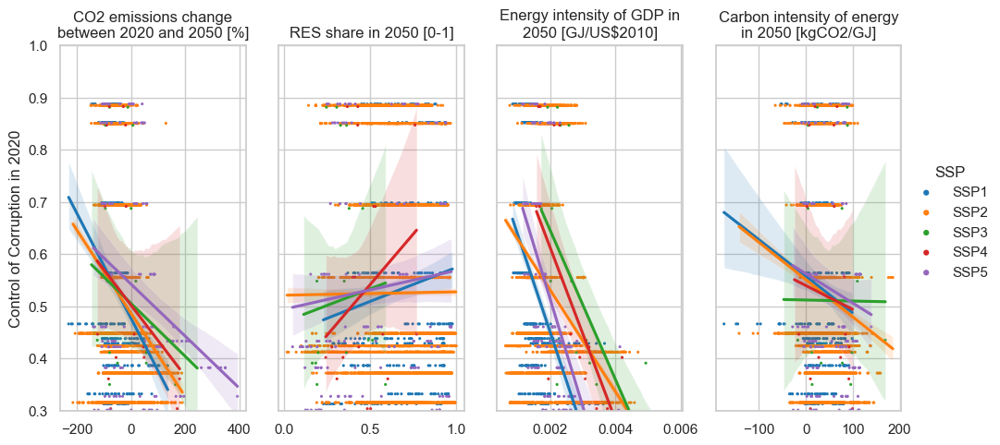

In [162]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Governance Index|Control of Corruption [unweighted mean]',
    label_assumption='Control of Corruption',
    year_assumption=2020,
    year_impact=2050,
    file_name='figure_impacts_corruption.png'
)

### Effectiveness

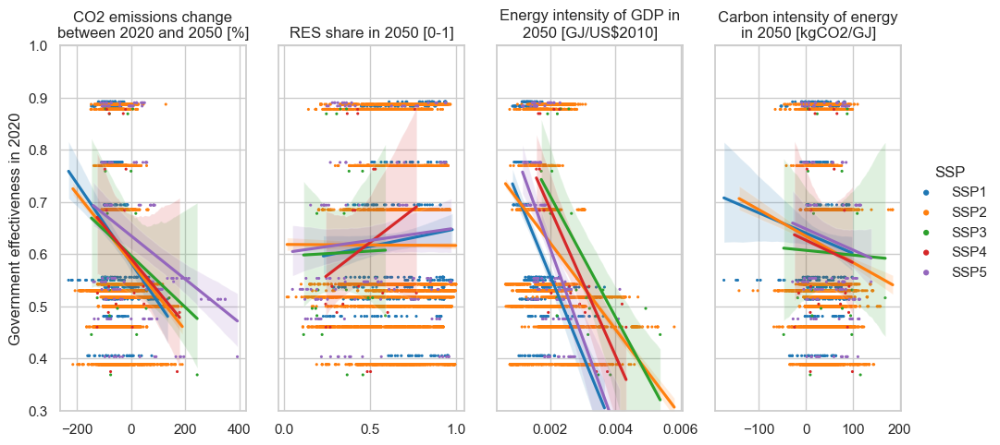

In [163]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Governance Index|Government Effectiveness [unweighted mean]',
    label_assumption='Government effectiveness',
    year_assumption=2020,
    year_impact=2050,
    file_name='figure_impacts_effectiveness.png'
)

### Justice

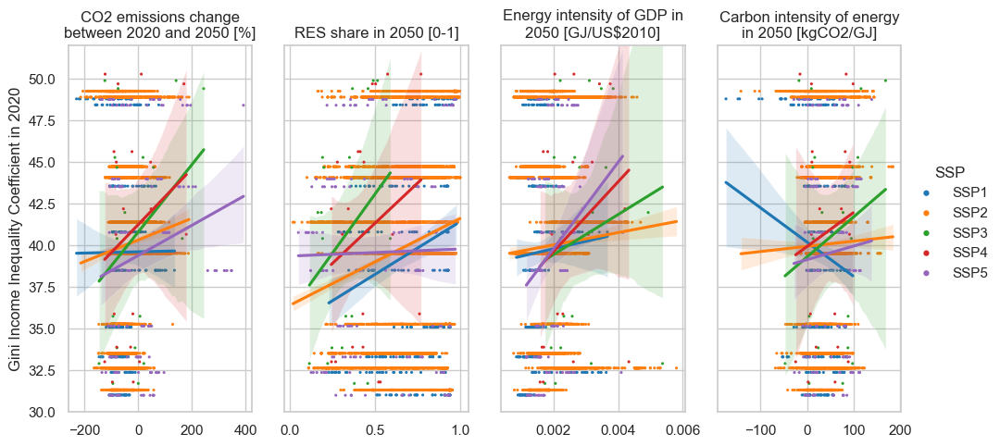

In [164]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Gini Income Inequality Coefficient [unweighted mean]',
    label_assumption='Gini Income Inequality Coefficient',
    year_assumption=2020,
    year_impact=2050,
    ylim=[30,52],
    file_name='figure_impacts_gini.png'
)

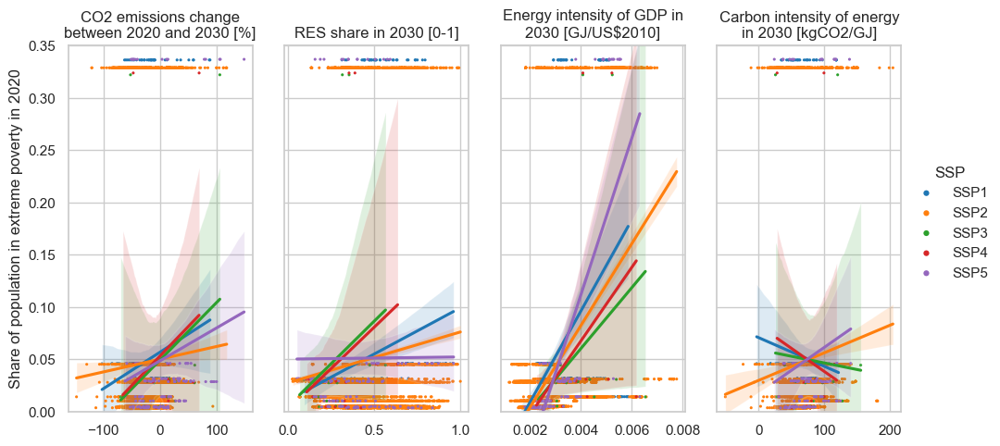

In [165]:
plot_assumption_vs_impacts(
    df_merged,
    var_assumption='Population|Extreme Poverty [Share]',
    label_assumption='Share of population in extreme poverty',
    year_assumption=2020,
    year_impact=2030,
    impacts=[
        'Emissions|CO2 - % change between 2020 and 2030', 'RES share', 
        'Energy intensity', 'Carbon intensity'
    ],
    impacts_titles = [
        'CO2 emissions change between 2020 and 2030 [%]','RES share in 2030 [0-1]',
        'Energy intensity of GDP in 2030 [GJ/US$2010]','Carbon intensity of energy in 2030 [kgCO2/GJ]'
    ],
    ylim=[0,0.35],
    file_name='figure_impacts_poverty.png'
)